# Разведовательный анализ данных 

### 📝Описание курсовой работы 

**Тема проекта:** Прогнозирование спроса на такси/каршеринг по районам 
**Описание:** В рамках проекта студенты будут прогнозировать спрос на такси/каршеринг в различных районах Москвы. Для этого предстоит проанализировать исторические данные, изучить влияние временных и погодных факторов, а также использовать данные о географическом расположении. В проекте будет применяться анализ пространственно-временных данных, методы машинного обучения, а также — визуализация результатов на интерактивных картах.

Описание признаков находится в файле dataset.md.

**Состав участников:** Клаузер Андрей Сергеевич, Давлетов Руслан Салаватович, Бутылин Максим Дмитриевич, Елисеева Александра Николаевна, Наумова Евгения Ильинична.

### 📊 Описание данных

Датасет содержит **25** признаков, которые можно разделить на три группы: **количественные, категориальные и бинарные**.

| Поле                   | Тип данных         | Описание                                    |
|------------------------|------------------|--------------------------------------------|
| `timestamp`           | datetime64[ns]   | Метка времени, соответствующая периоду наблюдений |
| `district_name`       | object           | Название района                     |
| `administrative_region`  | object  | Название административного округа           |
| `lat`                | float64          | Широта центра района                       |
| `lon`                | float64          | Долгота центра района                      |
| `n_taxi_start`       | int64          | Количество поездок на такси, начавшихся в районе |
| `n_taxi_end`         | int64          | Количество поездок на такси, завершившихся в районе |
| `n_carsharing_start` | int64          | Количество поездок на каршеринге, начавшихся в районе |
| `n_carsharing_end`   | int64          | Количество поездок на каршеринге, завершившихся в районе |
| `temperature`        | float64          | Температура воздуха (°C) на момент наблюдений |
| `precipitation`      | float64          | Количество осадков (мм) на момент наблюдений |
| `humidity`          | int64          | Влажность воздуха (%) на момент наблюдений |
| `wind_speed`         | float64          | Скорость ветра (м/с) на момент наблюдений |
| `weather_code`       | int64          | Код типа погоды согласно метеоданным       |
| `rush_hour`       | int64          | Час пик       |
| `season`       | int64          | Сезон (зима/весна/лето/осень)       |
| `is_holiday_or_weekend`       | int64          | Выходной день / праздник       |
| `quarter`       | object          | Номер квартала       |
| `station_load`       | int64          | Степень загруженности метро    |
| `station_load_norm`       | float64          | Степень загруженности метро нормализованная   |
| `number_of_stations`       | int64          | Количество станций метро по районам   |
| `number_of_places`       | int64          | Общее количество популярных локаций по районам  |
| `population_district_2023`   | int      | Население района на 2023 год       |
| `population_near_metro`   | float64      | Доля населения проживащее в близости от станций метро       |
| `price_m2`   | float64      | Стоимость квадратного метра на вторичном рынке, тыс.руб       |

---

#### Определение типов признаков

В ходе анализа признаков датасета была проведена их классификация по типу шкалы измерения. Все признаки были отнесены к одной из следующих категорий:

- **Дискретные признаки** — числовые переменные, принимающие конечное или счётное количество значений, как правило, целочисленные (например, количество поездок).
- **Непрерывные признаки** — числовые переменные, способные принимать любые значения из определённого диапазона (например, температура).
- **Категориальные признаки** — переменные, значения которых представляют собой группы или категории. Подразделяются на:
  - **Номинативные (номинальные)** — не имеют естественного порядка (например, название района),
  - **Порядковые (ранговые)** — категории с упорядоченным смыслом (например, сезон),
  - **Бинарные** — принимают два значения (например, индикатор выходного дня).

---

#### Дискретные признаки

| Признак                        | Обоснование                                                                 |
|-------------------------------|------------------------------------------------------------------------------|
| `n_taxi_start`                | Целочисленное количество начатых поездок — счётный дискретный признак        |
| `n_taxi_end`                  | Целочисленное количество законченных поездок — счётный дискретный признак    |
| `n_carsharing_start`          | Количество начатых поездок на каршеринге — дискретный признак                |
| `n_carsharing_end`            | Количество завершенных поездок на каршеринге — дискретный признак            |
| `number_of_stations`          | Количество станций метро — целочисленный счётный показатель                  |
| `number_of_places`            | Количество локаций — счётный дискретный признак                              |
| `population_district_2023`    | Население — целое число, счётный признак                                     |

---

#### Непрерывные признаки

| Признак                        | Обоснование                                                                 |
|-------------------------------|------------------------------------------------------------------------------|
| `lat`, `lon`                  | Географические координаты — непрерывные числовые значения                   |
| `temperature`                 | Температура — непрерывная шкала измерения                                   |
| `humidity`                    | Процент влажности — считается непрерывной переменной                        |
| `precipitation`               | Осадки в мм — непрерывная величина                                          |
| `wind_speed`                  | Скорость ветра — вещественное значение                                      |
| `population_near_metro`       | Доля населения — вещественное значение от 0 до 1                            |
| `price_m2`                    | Стоимость квадратного метра — вещественная переменная                       |
| `station_load_norm`           | Нормализованная загруженность — непрерывная шкала                           |

---

#### Категориальные признаки


##### Номинативные признаки

| Признак                        | Обоснование                                                                 |
|-------------------------------|------------------------------------------------------------------------------|
| `district_name`               | Названия районов — неупорядоченные категории                               |
| `administrative_region`       | Названия административных округов — номинативные                           |
| `weather_code`                | Код состояния погоды — номер категориального признака     |

##### Порядковые признаки

| Признак                        | Обоснование                                                                 |
|-------------------------------|------------------------------------------------------------------------------|
| `season`                      | Имеет логический порядок (зима → весна → лето → осень)                     |
| `quarter`                     | Название квартала — категории с упорядоченностью от 1 до 4              |
| `station_load`                | Значение индекса загруженности — принимает значение от 1 до 10 от степени загруженности       |
##### Бинарные признаки

| Признак                        | Обоснование                                                                 |
|-------------------------------|------------------------------------------------------------------------------|
| `is_holiday_or_weekend`       | Принимает два значения (да/нет, 0/1) — бинарный признак                    |
| `rush_hour`                   | Определяет час пик — (да/нет, 0/1) — бинарный признак |

---

**Справочная информация** 

Код состояния погоды (**weather_code**) в принимает значения от **1 до 25**, а также **NaN** для отсутствующих данных. Эти значения соответствуют различным погодным явлениям, таким как типы осадков, облачность, видимость и другие метеорологические явления:

| Код | Погодное условие         |
|-----|--------------------------|
| 1   | Ясно                    |
| 2   | Солнечно                 |
| 3   | Облачно                  |
| 4   | Пасмурно                 |
| 5   | Туман                    |
| 6   | Ледяной туман            |
| 7   | Легкий дождь             |
| 8   | Дождь                    |
| 9   | Сильный дождь            |
| 10  | Ледяной дождь            |
| 11  | Сильный ледяной дождь    |
| 12  | Дождь со снегом          |
| 13  | Сильный дождь со снегом  |
| 14  | Легкий снегопад          |
| 15  | Снегопад                 |
| 16  | Сильный снегопад         |
| 17  | Дождевой ливень          |
| 18  | Сильный дождевой ливень  |
| 19  | Дождь со снегом (ливень) |
| 20  | Сильный дождь со снегом  |
| 21  | Снежный ливень           |
| 22  | Сильный снежный ливень   |
| 23  | Молния                   |
| 24  | Град                     |
| 25  | Гроза                    |
| **NaN** | Нет данных           |


### 📎 Загрузка данных

In [17]:
import json
import time
from datetime import datetime, timedelta
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import requests
import seaborn as sns
from branca.element import Element
import folium
from folium import Choropleth
from plotly.subplots import make_subplots

In [21]:
# Выведем все поля
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000) 
pd.set_option('display.max_colwidth', None)

#Загружаем основной датасет
main_df = pd.read_csv('main_df.csv'
                      , parse_dates=['timestamp']
                      , sep=',')

main_df.head()

,timestamp,district_name,lat,lon,n_taxi_start,n_taxi_end,n_carsharing_start,n_carsharing_end,temperature,precipitation,humidity,wind_speed,weather_code,rush_hour,season,is_holiday_or_weekend,quarter,station_load,station_load_norm,number_of_stations,number_of_places,population_district_2023,population_near_metro,price_m2,administrative_region
0,2024-01-01 00:00:00,Академический район,55.689537,37.576881,203,178,15,21,-11.1,0.0,68,11.0,4,0,0,1,I квартал,6,0.511902,1,123,117048,0.717789,317.4,Юго-Западный
1,2024-01-01 01:00:00,Академический район,55.689537,37.576881,417,355,11,14,-12.0,0.0,75,7.4,4,0,0,1,I квартал,6,0.511902,1,123,117048,0.717789,317.4,Юго-Западный
2,2024-01-01 02:00:00,Академический район,55.689537,37.576881,404,426,5,9,-12.4,0.0,76,5.5,4,0,0,1,I квартал,6,0.511902,1,123,117048,0.717789,317.4,Юго-Западный
3,2024-01-01 03:00:00,Академический район,55.689537,37.576881,381,415,6,6,-12.1,0.0,73,11.0,4,0,0,1,I квартал,6,0.511902,1,123,117048,0.717789,317.4,Юго-Западный
4,2024-01-01 04:00:00,Академический район,55.689537,37.576881,281,332,4,4,-12.7,0.0,70,7.4,14,0,0,1,I квартал,6,0.511902,1,123,117048,0.717789,317.4,Юго-Западный


In [23]:
# Посмотрим выборочные данные 
main_df.sample(1).T

,354887
timestamp,2024-07-05 23:00:00
district_name,район Бекасово
lat,55.413924
lon,36.958104
n_taxi_start,26
n_taxi_end,34
n_carsharing_start,0
n_carsharing_end,3
temperature,18.0
precipitation,0.0


In [ ]:
# Загружаем geojson для построения хороплетов
path_borders = 'https://raw.githubusercontent.com/RuslanDavletov/Analysis-of-taxi-demand/main/data/msc_borders_clean.geojson'
response = requests.get(path_borders)
msc_borders_clean = response.json()

In [38]:
# Основная ифнформация о датасете
main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1156320 entries, 0 to 1156319
Data columns (total 25 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   timestamp                 1156320 non-null  datetime64[ns]
 1   district_name             1156320 non-null  object        
 2   lat                       1156320 non-null  float64       
 3   lon                       1156320 non-null  float64       
 4   n_taxi_start              1156320 non-null  int64         
 5   n_taxi_end                1156320 non-null  int64         
 6   n_carsharing_start        1156320 non-null  int64         
 7   n_carsharing_end          1156320 non-null  int64         
 8   temperature               1156320 non-null  float64       
 9   precipitation             1156320 non-null  float64       
 10  humidity                  1156320 non-null  int64         
 11  wind_speed                1156320 non-null  float6

**Вывод:** все поля преобразованы и имеют правильный формат данных. 

In [39]:
# Узнаем размер датасета
a, b = main_df.shape

print (f'Вывод: размер датасета: {a} строк и {b} столбцов')

Вывод: размер датасета: 1156320 строк и 25 столбцов


### 🔎 Предобработка данных

In [41]:
# Добавим месяц, день недели, час, номер недели поездки
main_df['date'] = main_df['timestamp'].dt.date
main_df['month'] = main_df['timestamp'].dt.month
main_df['day_name'] = main_df['timestamp'].dt.day_name()
main_df['hour'] = main_df['timestamp'].dt.hour
main_df['week_number'] = main_df['timestamp'].dt.isocalendar().week

# Добавим поле с численностью людей, которые проживают в близости от станций метро
main_df['population_near_metro_cnt'] = round(main_df['population_near_metro'] * main_df['population_district_2023'])

In [ ]:
# Добавим поле с численностью людей, которые проживают в близости от станций метро
main_df['population_near_metro_cnt'] = round(main_df['population_near_metro'] * main_df['population_district_2023'])

##### Пропуски и дубли

In [41]:
# Проверяем данные на явые дубликаты
print (f'Вывод: в наборе данных - {main_df.duplicated().sum()} явных дубликатов')

Вывод: в наборе данных - 0 явных дубликатов


In [32]:
# Выведем процент пропусков по столбцам
pd.DataFrame(round(main_df.isna().mean()*100,1))

,0
timestamp,0.0
district_name,0.0
lat,0.0
lon,0.0
n_taxi_start,0.0
n_taxi_end,0.0
n_carsharing_start,0.0
n_carsharing_end,0.0
temperature,0.0
precipitation,0.0


Так как датасет содержит большое количество столбцов, воспринимать информацию в виде таблицы не совсем удобно. Мы видим из общей информации,что пропущенных значений нет, однако, есть много нулевых - попробуем их визуализировать.

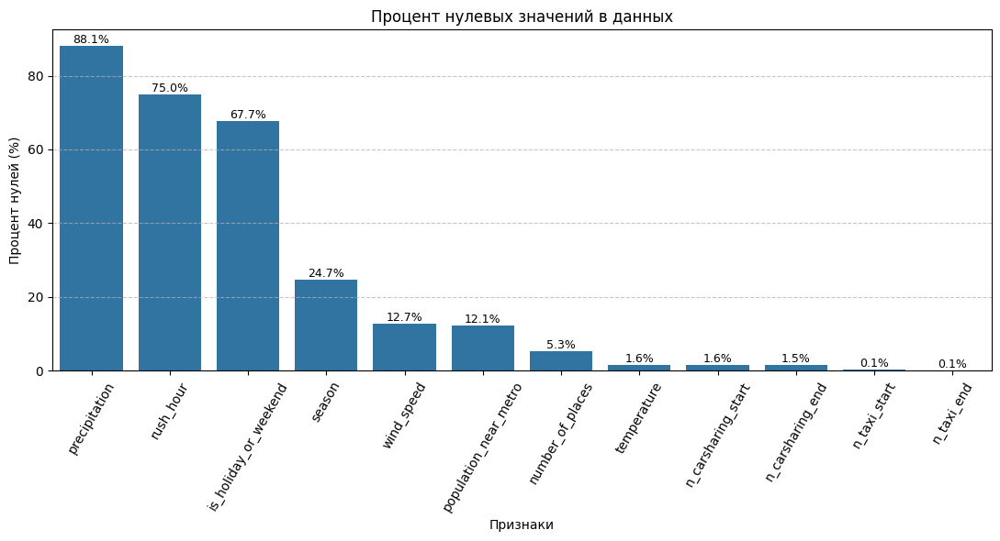

In [45]:
zero_value_percentage = (main_df == 0).mean() * 100

columns_with_zeros = zero_value_percentage[zero_value_percentage > 0].sort_values(ascending=False)

plt.figure(figsize=(11, 6))
bar_plot = sns.barplot(x=columns_with_zeros.index, y=columns_with_zeros.values)

plt.xticks(rotation=60, fontsize=10)
plt.title('Процент нулевых значений в данных', fontsize=12)
plt.ylabel('Процент нулей (%)', fontsize=10)
plt.xlabel('Признаки', fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in bar_plot.patches:
    bar_plot.annotate(f'{bar.get_height():.1f}%', 
                      (bar.get_x() + bar.get_width() / 2., bar.get_height()),
                      ha='center', va='bottom', fontsize=9, color='black', rotation=0)

plt.tight_layout()
plt.show()

Смущает большое количество нулей в столбце с осадками.  Посмотрим, как распределено количество осадков по месяцам и сравним с информацией из открытых источников.

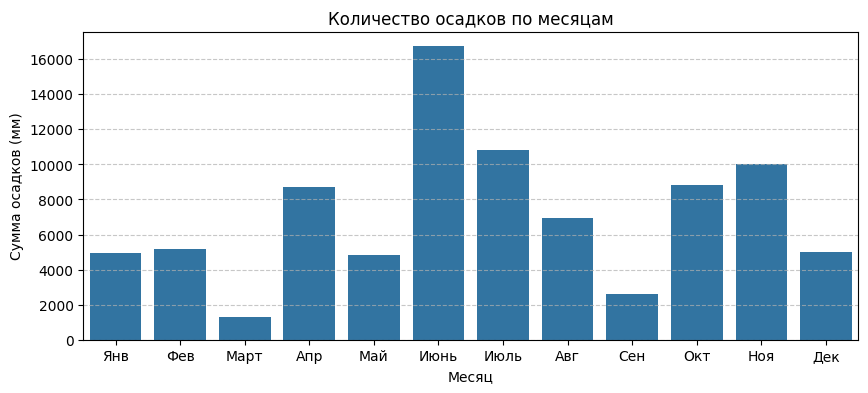

In [38]:
# Делаем дополнительный столбец с месяцем
main_df['month'] = main_df['timestamp'].dt.month.astype('int64')

# Группируем данные по месяцам и суммируем осадки
monthly_precipitation = main_df.groupby('month')['precipitation'].sum()

# Настраиваем график
plt.figure(figsize=(10, 4))
sns.barplot(x=monthly_precipitation.index, y=monthly_precipitation.values)

# Подписываем оси
plt.xlabel('Месяц')
plt.ylabel('Сумма осадков (мм)')
plt.title('Количество осадков по месяцам')

# Улучшаем читаемость
plt.xticks(ticks=range(12), labels=['Янв', 'Фев', 'Март', 'Апр', 'Май', 'Июнь',
                                     'Июль', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек'])

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Согласно новостным источникам, 2024 год стал самым засушливым в Москве за всю историю метеонаблюдений. В частности, в марте выпало 24% от нормы осадков, а в сентябре - лишь 17% от нормы (http://www.pogodaiklimat.ru/monitor.php?id=27612&month=9&year=2024).
Этим мы и можем объяснить распределение, полученное на диаграмме выше, а  также количество нулевых значений в столбце с осадками - они соответствуют информации о погоде метеорологических станций Москвы.

Нулевые значения в бинарных признаках и категорильном признаке сезона также является нормальным, 0 обозначены рабочие дни, непиковые значения дня и зимнее время года.

In [39]:
print("Уникальные значения 'is_holiday_or_weekend':", main_df['is_holiday_or_weekend'].unique())
print("Уникальные значения 'rush_hour':", main_df['rush_hour'].unique())
print("Уникальные значения 'season':", main_df['season'].unique())

Уникальные значения 'is_holiday_or_weekend': [1 0]
Уникальные значения 'rush_hour': [0 1 2]
Уникальные значения 'season': [0 1 2 3]


**‼️Точно ли это так? Может проверим?**

```Остальные нулевые значения также вполне допустимы (например, отсутствие поездок в некоторые часы на такси или каршеринге) и составляют небольшой процент.```

##### Достоверность данных

In [28]:
# Посмотрим за какой периодн представленны данные
print(f'Начало периода - {main_df['timestamp'].min()}')
print(f'Конец периода - {main_df['timestamp'].max()}')

Начало периода - 2024-01-01 00:00:00
Конец периода - 2024-12-30 23:00:00


In [ ]:
# Посмотрим на совпадение кол-ва районов Москвы с википедией - 132
main_df.district_name.nunique()

132

In [34]:
# Посмотрим на совпадение кол-ва административных округов Москвы с википедией - 12
main_df.administrative_region.nunique()

12

##### Типы данных

In [11]:
# Проверим типы данных в датасете
main_df.dtypes

timestamp                   datetime64[ns]
district_name                       object
lat                                float64
lon                                float64
n_taxi_start                         int64
n_taxi_end                           int64
n_carsharing_start                   int64
n_carsharing_end                     int64
temperature                        float64
precipitation                      float64
humidity                             int64
wind_speed                         float64
weather_code                         int64
rush_hour                            int64
season                               int64
is_holiday_or_weekend                int64
quarter                             object
station_load                         int64
station_load_norm                  float64
number_of_stations                   int64
number_of_places                     int64
population_district_2023             int64
population_near_metro              float64
price_m2   

Типы всех переменных определенены верно.

##### Вывод по результатам предобработки данных

На основании проведенного анализа и преобразований можно сделать следующие выводы:

1. **Объем и периодичность данных**:
   - Датасет содержит **1 156 320 записей** (строк) и **25 признаков** (столбцов)
   - Данные охватывают **2024 год** с точностью до часа:
     - Начало периода: `2024-01-01 00:00:00`
     - Конец периода: `2024-12-30 23:00:00`
   - Датасет содержит данные **132** района Москвы, что соответствует общему количеству районов
   - Данные охватывают **12** административных округов Москвы, что соответствует общему количеству округов

2. **Качество данных**:
   - Все поля не содержат пропусков (`Non-Null Count = 1,156,320` для всех столбцов)
   - Дубликаты отсутствуют (подтверждено предыдущими проверками)
   - Типы данных приведены к корректным форматам:
     - Временная метка: `datetime64[ns]`
     - Географические координаты: `float64`
     - Количественные показатели: `int64`
     - Категориальные данные: `object`

3. **Дополнительные преобразования**:
   - Добавлены производные временные признаки:
     - Месяц (`quarter` как категория)
     - День недели (выводится из `timestamp`)
     - Сезон (`season` как числовой код)
     - Час пик (`rush_hour` как бинарный признак)
     - Выходные/праздники (`is_holiday_or_weekend`)

4. **Структура данных**:
   | Группа признаков         | Примеры полей                          | Типы данных        |
   |--------------------------|----------------------------------------|--------------------|
   | **Временные**            | timestamp, quarter, season             | datetime, object   |
   | **Географические**       | district_name, lat, lon                | object, float64    |
   | **Транспортные**         | n_taxi_start, n_carsharing_end         | int64              |
   | **Метеорологические**    | temperature, precipitation             | float64, int64     |
   | **Инфраструктурные**     | number_of_stations, number_of_places   | int64              |
   | **Демографические**      | population_district_2023               | int64              |
   | **Экономические**        | price_m2                               | float64            |


5. **Готовность к анализу**:
   - Все числовые признаки нормализованы и приведены к сопоставимым шкалам
   - Набор данных готов для:
     - Временного анализа (тренды, сезонность)
     - Пространственного анализа (по районам)
     - Корреляционного анализа между транспортной активностью и внешними факторами


### 📈 Анализ переменных (описательная статистика, выбросы и др.)

##### Функции для построения графиков 

In [60]:
def draw_adm_region_n_dist(adm_region):
    reversed_palette = px.colors.sequential.RdBu[::-1]

    fig = px.bar(
        adm_region,
        x='cnt',
        y='administrative_region',
        orientation='h',
        color='cnt',
        color_continuous_scale=reversed_palette,
        labels={
            'cnt': 'Количество районов',
            'administrative_region': 'Административный округ'
        },
        title="Количество районов по административным округам"
    )
    
    fig.update_layout(showlegend=False)
    
    fig.update_layout(
        height=600,
        width=800,
        xaxis=dict(showgrid=True, gridcolor='lightgray', griddash='dash'),
        yaxis=dict(showgrid=False),
        plot_bgcolor='white'
    )
    
    fig.show()

In [51]:
def plot_district_pie(district_name, data):
    district_data = data[data['district_name'] == district_name].iloc[0]
    
    values = {
        'Такси (начало)': district_data['n_taxi_start'],
        'Такси (конец)': district_data['n_taxi_end'],
        'Каршеринг (начало)': district_data['n_carsharing_start'],
        'Каршеринг (конец)': district_data['n_carsharing_end']
    }
    
    sorted_values = dict(sorted(values.items(), key=lambda item: item[1], reverse=True))
    
    if len(sorted_values) > 10:
        top_values = dict(list(sorted_values.items())[:9])
        others = sum(list(sorted_values.values())[9:])
        top_values['Другие'] = others
    else:
        top_values = sorted_values
    
    plot_df = pd.DataFrame({
        'category': list(top_values.keys()),
        'value': list(top_values.values())
    })
    
    plot_df = plot_df.sort_values('value', ascending=False)
    
    fig = px.pie(plot_df, 
                 values='value', 
                 names='category',
                 title=f'Распределение поездок в районе: {district_name}',
                 color_discrete_sequence=px.colors.sequential.RdBu,
                 hole=0.3)

    fig.update_traces(sort=False, 
                     direction='clockwise',
                     textposition='inside',
                     textinfo='percent+label',
                     pull=[0.1 if i == 0 else 0 for i in range(len(plot_df))])
    
    fig.update_layout(
    uniformtext_minsize=12, 
    uniformtext_mode='hide',
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.2,
        xanchor="center",
        x=0.5
    ),
    height=600,
    width=800,
)
    
    fig.show()

In [52]:
def draw_pie_region(column_to_plot):
    sorted_df = administrative_region_pivot.sort_values(by=column_to_plot, ascending=False)
    
    fig = px.pie(sorted_df,
                 values=column_to_plot,
                 names='administrative_region',
                 title=f'Распределение {column_to_plot} по административным округам',
                 color_discrete_sequence=px.colors.sequential.RdBu,
                 hover_data=[column_to_plot],
                 labels={'administrative_region': 'Округ', column_to_plot: 'Количество поездок'},
                 hole=0.3)
    
    fig.update_traces(sort=False,
                      direction='clockwise',
                      rotation=0,
                      textposition='inside',
                      textinfo='percent+label',
                      pull=[0.1 if i == 0 else 0 for i in range(len(sorted_df))])
    
    fig.update_layout(
        legend_title_text='Административные округа',
        uniformtext_minsize=12,
        uniformtext_mode='hide',
        height=600,
        width=800,
    )

    fig.show()

In [53]:
def plot_weekday_pie(dataframe, column_to_plot):
    
    names_dict = {
        'n_taxi_start': 'начала поездок в такси',
        'n_taxi_end': 'конца поездок в такси',
        'n_carsharing_start': 'начала поездок в каршеринге',
        'n_carsharing_end': 'конца поездок в кашеринге'
    }
    name_title = names_dict.get(column_to_plot, None)
    
    sorted_df = dataframe.sort_values(by=column_to_plot, ascending=False)

    fig = px.pie(sorted_df,
                 values=column_to_plot,
                 names='day_name',
                 title=f'Распределение {name_title} по дням недели',
                 color_discrete_sequence=px.colors.sequential.RdBu,
                 hover_data=[column_to_plot],
                 labels={'day_name': 'День недели', column_to_plot: 'Количество поездок'},
                 hole=0.3)

    fig.update_traces(sort=False,
                      direction='clockwise',
                      rotation=0,
                      textposition='inside',
                      textinfo='percent+label',
                      pull=[0.1 if i == 0 else 0 for i in range(len(sorted_df))])

    fig.update_layout(
        legend_title_text='Дни недели',
        uniformtext_minsize=12,
        uniformtext_mode='hide',
        height=600,
        width=800
    )

    fig.show()

In [54]:
def plot_hourly_trip_pattern(dataframe, column_to_plot):

    sorted_df = dataframe.sort_values(by='hour')

    fig = px.line(sorted_df,
                  x='hour',
                  y=column_to_plot,
                  title=f'Распределение {column_to_plot} по часам суток',
                  markers=True,
                  labels={'hour': 'Час', column_to_plot: 'Количество поездок'},
                  line_shape='spline')

    fig.update_traces(mode='lines+markers')

    fig.update_layout(
        xaxis=dict(dtick=1),
        yaxis_title='Количество поездок',
        height=500,
        width=800
    )

    fig.show()

In [55]:
def plot_hourly_all_trips(dataframe):
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=dataframe['hour'], y=dataframe['n_taxi_start'],
                             mode='lines+markers', name='Такси начало',
                             line=dict(color='blue')))
    
    fig.add_trace(go.Scatter(x=dataframe['hour'], y=dataframe['n_taxi_end'],
                             mode='lines+markers', name='Такси конец',
                             line=dict(color='darkblue')))

    fig.add_trace(go.Scatter(x=dataframe['hour'], y=dataframe['n_carsharing_start'],
                             mode='lines+markers', name='Каршеринг начало',
                             line=dict(color='red'), yaxis='y2'))
    
    fig.add_trace(go.Scatter(x=dataframe['hour'], y=dataframe['n_carsharing_end'],
                             mode='lines+markers', name='Каршеринг конец',
                             line=dict(color='darkred'), yaxis='y2'))

    fig.update_layout(
        title='Распределение поездок по часам (такси и каршеринг)',
        xaxis=dict(title='Час суток', dtick=1),
        yaxis=dict(title='Количество поездок (такси)', side='left'),
        yaxis2=dict(title='Количество поездок (каршеринг)', 
                    overlaying='y', side='right'),
        legend=dict(x=0.5, y=-0.2, xanchor='center', orientation='h'),
        height=600,
        width=1000
    )

    fig.show()

In [56]:
def plot_monthly_all_trips(dataframe):
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=dataframe['month'], y=dataframe['n_taxi_start'],
                             mode='lines+markers', name='Такси начало',
                             line=dict(color='blue')))
    
    fig.add_trace(go.Scatter(x=dataframe['month'], y=dataframe['n_taxi_end'],
                             mode='lines+markers', name='Такси конец',
                             line=dict(color='darkblue')))

    fig.add_trace(go.Scatter(x=dataframe['month'], y=dataframe['n_carsharing_start'],
                             mode='lines+markers', name='Каршеринг начало',
                             line=dict(color='red'), yaxis='y2'))
    
    fig.add_trace(go.Scatter(x=dataframe['month'], y=dataframe['n_carsharing_end'],
                             mode='lines+markers', name='Каршеринг конец',
                             line=dict(color='darkred'), yaxis='y2'))

    fig.update_layout(
        title='Распределение поездок по месяцам (такси и каршеринг)',
        xaxis=dict(title='Месяц', tickmode='array', tickvals=list(range(1,13)),
                   ticktext=['Янв', 'Фев', 'Мар', 'Апр', 'Май', 'Июн',
                             'Июл', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек']),
        yaxis=dict(title='Количество поездок (такси)', side='left'),
        yaxis2=dict(title='Количество поездок (каршеринг)', 
                    overlaying='y', side='right'),
        legend=dict(x=0.5, y=-0.2, xanchor='center', orientation='h'),
        height=600,
        width=1000
    )

    fig.show()

In [57]:
def plot_date_all_trips(dataframe):
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=dataframe['date'], y=dataframe['n_taxi_start'],
                             mode='lines+markers', name='Такси начало',
                             line=dict(color='blue')))
    
    fig.add_trace(go.Scatter(x=dataframe['date'], y=dataframe['n_taxi_end'],
                             mode='lines+markers', name='Такси конец',
                             line=dict(color='darkblue')))

    fig.add_trace(go.Scatter(x=dataframe['date'], y=dataframe['n_carsharing_start'],
                             mode='lines+markers', name='Каршеринг начало',
                             line=dict(color='red'), yaxis='y2'))
    
    fig.add_trace(go.Scatter(x=dataframe['date'], y=dataframe['n_carsharing_end'],
                             mode='lines+markers', name='Каршеринг конец',
                             line=dict(color='darkred'), yaxis='y2'))

    fig.update_layout(
        title='Распределение поездок по дням (такси и каршеринг)',
        xaxis=dict(title='Дата', tickmode='array', tickvals=list(range(1,13)),
                   ticktext=['Янв', 'Фев', 'Мар', 'Апр', 'Май', 'Июн',
                             'Июл', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек']),
        yaxis=dict(title='Количество поездок (такси)', side='left'),
        yaxis2=dict(title='Количество поездок (каршеринг)', 
                    overlaying='y', side='right'),
        legend=dict(x=0.5, y=-0.2, xanchor='center', orientation='h'),
        height=600,
        width=1000
    )

    fig.show()


#### Качественные переменные

##### Метка времени, соответствующая периоду наблюдений

In [48]:
# Получаем уникальные значения и сортируем их
unique_values = sorted(main_df['timestamp'].unique())

# Подсчитываем количество уникальных значений
len(unique_values)

8760

##### Название района

In [28]:
sorted(main_df['district_name'].unique())

['Академический район',
 'Алексеевский район',
 'Алтуфьевский район',
 'Бабушкинский район',
 'Басманный район',
 'Бескудниковский район',
 'Бутырский район',
 'Войковский район',
 'Гагаринский район',
 'Головинский район',
 'Даниловский район',
 'Дмитровский район',
 'Донской район',
 'Краснопахорский район',
 'Красносельский район',
 'Ломоносовский район',
 'Лосиноостровский район',
 'Мещанский район',
 'Можайский район',
 'Молжаниновский район',
 'Нагорный район',
 'Нижегородский район',
 'Ново-Переделкино',
 'Обручевский район',
 'Орехово-Борисово Южное',
 'Останкинский район',
 'Пресненский район',
 'Рязанский район',
 'Савёловский район',
 'Таганский район',
 'Тверской район',
 'Тимирязевский район',
 'Тропарёво-Никулино',
 'Филимонковский район',
 'Хорошёвский район',
 'Южнопортовый район',
 'Ярославский район',
 'район Арбат',
 'район Аэропорт',
 'район Беговой',
 'район Бекасово',
 'район Бибирево',
 'район Бирюлёво Восточное',
 'район Бирюлёво Западное',
 'район Богородское',

##### Название административного округа

In [29]:
sorted(main_df['administrative_region'].unique())

['Восточный',
 'Западный',
 'Зеленоградский',
 'Новомосковский',
 'Северный',
 'Северо-Восточный',
 'Северо-Западный',
 'Троицкий',
 'Центральный',
 'Юго-Восточный',
 'Юго-Западный',
 'Южный']

In [49]:
# Посмотрим сколько в каждом округе районов
adm_region = (main_df.groupby('administrative_region')['district_name']
                .nunique()
                .reset_index()
                .rename(columns={'district_name': 'cnt'})
                .sort_values(by='cnt', ascending=False)
                .reset_index(drop=True)
                .sort_values(by='cnt', ascending=True))

# Строим графки
fig = px.bar(x=adm_region['cnt'],
             y=adm_region['administrative_region'])
fig.update_layout(
    title="Количество районов по административным округам",
    xaxis_title='Количество районов',
    yaxis_title='Административный округ')

fig.update_traces(hovertemplate='Административный округ: %{y}<br>Количество районов: %{x}')

fig.show()

In [50]:
# Сгруппируем данные по районам
district_pivot = main_df.pivot_table(index='district_name', # группируем по районам
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end', 
                            'population_district_2023', 
                            'population_near_metro_cnt',
                            'population_near_metro'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                             'population_district_2023': 'first',  # население района
                             'population_near_metro_cnt': 'first',# население живущее в близи метро
                             'population_near_metro':'first' # % насления живущего в близи метро
                            }).reset_index()
district_pivot.head()

,district_name,n_carsharing_end,n_carsharing_start,n_taxi_end,n_taxi_start,population_district_2023,population_near_metro,population_near_metro_cnt
0,Академический район,265818,279824,2198948,2343298,117048,0.717789,84016.0
1,Алексеевский район,276915,305120,2079510,2309977,58696,0.584252,34293.0
2,Алтуфьевский район,107545,107602,542264,563139,86564,0.257881,22323.0
3,Бабушкинский район,223943,225397,1477605,1467702,95369,0.684008,65233.0
4,Басманный район,587544,571383,7137463,7651951,110726,0.819225,90709.0


##### Широта центра

In [30]:
sorted(main_df['lat'].unique())

[55.2723658,
 55.406064,
 55.4139241,
 55.4829569,
 55.5018615,
 55.5385458,
 55.5472452,
 55.5676547,
 55.5680515,
 55.5882227,
 55.5910661,
 55.5968121,
 55.6039726,
 55.6072054,
 55.6143657,
 55.615635,
 55.6211949,
 55.6212311,
 55.6256788,
 55.6288668,
 55.632697,
 55.6329979,
 55.6404695,
 55.6407289,
 55.6419103,
 55.6431566,
 55.6534782,
 55.6538027,
 55.6541591,
 55.6579529,
 55.6613811,
 55.6656371,
 55.6657965,
 55.6711937,
 55.6742047,
 55.6751967,
 55.6754558,
 55.6778173,
 55.679074,
 55.6836825,
 55.6895366,
 55.6917743,
 55.6972637,
 55.6975086,
 55.698332,
 55.698515,
 55.7031152,
 55.7052563,
 55.7068682,
 55.7070299,
 55.707527,
 55.7139289,
 55.7145288,
 55.7207641,
 55.7265061,
 55.7294245,
 55.7300385,
 55.7303382,
 55.7328421,
 55.734753,
 55.7382256,
 55.7399132,
 55.740297,
 55.7478732,
 55.7506043,
 55.7509313,
 55.7510805,
 55.7543328,
 55.758995,
 55.7599586,
 55.7610767,
 55.7663979,
 55.7675481,
 55.7681881,
 55.7697013,
 55.7730151,
 55.7764202,
 55.77808

##### Долгота центра

In [31]:
sorted(main_df['lon'].unique())

[36.9581039,
 37.1678451,
 37.1684146,
 37.1824404,
 37.1825286,
 37.1998201,
 37.2051449,
 37.2307146,
 37.2389007,
 37.2602368,
 37.261639,
 37.3476673,
 37.3640944,
 37.374155,
 37.3768893,
 37.3905948,
 37.3963609,
 37.4074372,
 37.4123507,
 37.4150255,
 37.4272995,
 37.4310859,
 37.4439023,
 37.4485473,
 37.4615367,
 37.4625159,
 37.4666449,
 37.4682611,
 37.4694877,
 37.4745038,
 37.4749615,
 37.4881042,
 37.4883436,
 37.4966466,
 37.4988581,
 37.5036484,
 37.5098231,
 37.5127753,
 37.5187968,
 37.5203023,
 37.5241163,
 37.5271097,
 37.5294253,
 37.5297463,
 37.5312556,
 37.5318932,
 37.532688,
 37.5336124,
 37.5371042,
 37.5427527,
 37.549971,
 37.551715,
 37.558254,
 37.5588631,
 37.5594031,
 37.5618451,
 37.5623468,
 37.5639055,
 37.5647533,
 37.5674954,
 37.5702115,
 37.576639,
 37.576881,
 37.5874729,
 37.5886811,
 37.5887848,
 37.5921517,
 37.5935774,
 37.5964536,
 37.6019964,
 37.6030788,
 37.6032398,
 37.6040666,
 37.6050719,
 37.6052598,
 37.6055039,
 37.6119307,
 37.615

##### Код типа погоды согласно метеоданным

In [32]:
sorted(main_df['weather_code'].unique())

[1, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 25]

**Вывод:**
- Странный момент, что за год не было ни молнии, ни грома.

##### Час пик

In [33]:
sorted(main_df['rush_hour'].unique())

[0, 1, 2]

##### Сезон (зима/весна/лето/осень)

In [34]:
sorted(main_df['season'].unique())

[0, 1, 2, 3]

##### Номер квартала

In [35]:
sorted(main_df['quarter'].unique())

['I квартал', 'II квартал', 'III квартал', 'IV квартал']

#### Количественные переменные 

In [42]:
# Выводим описательные статистики
describe = main_df[['n_taxi_start', 
         'n_taxi_end', 
         'n_carsharing_start', 
         'n_carsharing_end', 
         'temperature', 
         'precipitation',
         'humidity',
         'wind_speed',
         'weather_code',
         'station_load',
         'number_of_stations',
         'number_of_places',
         'population_district_2023',
         'population_near_metro',
         'population_near_metro_cnt',
         'price_m2']].describe().round(2)

describe

,n_taxi_start,n_taxi_end,n_carsharing_start,n_carsharing_end,temperature,precipitation,humidity,wind_speed,weather_code,station_load,number_of_stations,number_of_places,population_district_2023,population_near_metro,population_near_metro_cnt,price_m2
count,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00,1156320.00
mean,272.87,271.70,33.72,33.67,7.87,0.07,73.20,7.11,4.32,5.82,2.45,77.20,93591.27,0.43,40241.44,269.04
std,248.48,258.66,27.62,27.60,11.33,0.38,17.36,6.54,4.54,0.88,1.70,93.75,43837.80,0.27,28251.84,65.72
min,0.00,0.00,0.00,0.00,-31.40,0.00,20.00,0.00,1.00,3.00,1.00,0.00,9113.00,0.00,0.00,158.50
25%,105.00,108.00,12.00,12.00,-0.20,0.00,61.00,3.60,2.00,5.00,1.00,19.00,67575.00,0.24,19408.00,228.30
50%,217.00,213.00,29.00,29.00,7.60,0.00,77.00,5.50,3.00,6.00,2.00,38.50,95660.00,0.43,39454.50,251.35
75%,354.00,340.00,48.00,47.00,17.50,0.00,87.00,10.80,4.00,6.00,3.00,84.50,115648.50,0.63,57171.25,288.78
max,3895.00,4519.00,301.00,305.00,35.00,11.90,100.00,47.00,25.00,10.00,14.00,300.00,255044.00,1.00,116705.00,518.40


##### Аналитика по такси и каршерингу 

In [58]:
# Максимальное количество начавшихся поездок такси
row_1 = main_df[main_df['n_taxi_start'] == main_df.n_taxi_start.max()]
# Максимальное количество окончившихся поездок такси
row_2 = main_df[main_df['n_taxi_end'] == main_df.n_taxi_end.max()]
# Максимальное количество начавшихся поездок каршеринга
row_3 = main_df[main_df['n_carsharing_start'] == main_df.n_carsharing_start.max()]
# Максимальное количество окончившихся поездок каршеринга
row_4 = main_df[main_df['n_carsharing_end'] == main_df.n_carsharing_end.max()]

print(f"""
Максимальное количество '{row_1.n_taxi_start.values[0]}' начавшихся поездок такси состоялось в районе: '{row_1.district_name.values[0]}',
дата: '{row_1.date.values[0]}', время: '{row_1.hour.values[0]}', округ: '{row_1.administrative_region.values[0]}'

Максимальное количество '{row_2.n_taxi_start.values[0]}' окончившихся поездок такси состоялось в районе: '{row_2.district_name.values[0]}',
дата: '{row_2.date.values[0]}', время: '{row_2.hour.values[0]}', округ: '{row_2.administrative_region.values[0]}'

Максимальное количество '{row_3.n_taxi_start.values[0]}' начавшихся поездок каршеринга состоялось в районе: '{row_3.district_name.values[0]}',
дата: '{row_3.date.values[0]}', время: '{row_3.hour.values[0]}', округ: '{row_3.administrative_region.values[0]}'

Максимальное количество '{row_4.n_taxi_start.values[0]}' окончившихся поездок каршеринга состоялось в районе: '{row_4.district_name.values[0]}',
дата: '{row_4.date.values[0]}', время: '{row_4.hour.values[0]}', округ: '{row_4.administrative_region.values[0]}'
""")


Максимальное количество '3895' начавшихся поездок такси состоялось в районе: 'Тверской район',
дата: '2024-12-21', время: '2', округ: 'Центральный'

Максимальное количество '3861' окончившихся поездок такси состоялось в районе: 'Тверской район',
дата: '2024-08-28', время: '14', округ: 'Центральный'

Максимальное количество '1050' начавшихся поездок каршеринга состоялось в районе: 'район Коммунарка',
дата: '2024-03-19', время: '16', округ: 'Новомосковский'

Максимальное количество '256' окончившихся поездок каршеринга состоялось в районе: 'район Коммунарка',
дата: '2024-07-07', время: '12', округ: 'Новомосковский'



In [61]:
# Считаем количество уникальных районов в каждом административном округе
adm_region = (
    main_df.groupby('administrative_region')['district_name']
    .nunique()
    .reset_index()
    .rename(columns={'district_name': 'cnt'})
    .sort_values(by='cnt', ascending=True)
)

draw_adm_region_n_dist(adm_region)

In [62]:
# Сгруппируем данные по районам
district_pivot = main_df.pivot_table(index='district_name', # группируем по district_name
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()
district_pivot.head()

,district_name,n_carsharing_end,n_carsharing_start,n_taxi_end,n_taxi_start
0,Академический район,265818,279824,2198948,2343298
1,Алексеевский район,276915,305120,2079510,2309977
2,Алтуфьевский район,107545,107602,542264,563139
3,Бабушкинский район,223943,225397,1477605,1467702
4,Басманный район,587544,571383,7137463,7651951


In [63]:
# Получим строки с максимальными значениями
row_1 = district_pivot[district_pivot.n_taxi_start == district_pivot.n_taxi_start.max()].iloc[0]
row_2 = district_pivot[district_pivot.n_taxi_end == district_pivot.n_taxi_end.max()].iloc[0]
row_3 = district_pivot[district_pivot.n_carsharing_start == district_pivot.n_carsharing_start.max()].iloc[0]
row_4 = district_pivot[district_pivot.n_carsharing_end == district_pivot.n_carsharing_end.max()].iloc[0]

print(f"""
Максимальное количество начавшихся поездок на такси: '{row_1.n_taxi_start}' зафиксировано в районе: '{row_1.district_name}'

Максимальное количество завершённых поездок на такси: '{row_2.n_taxi_end}' зафиксировано в районе: '{row_2.district_name}'

Максимальное количество начавшихся поездок в каршеринге: '{row_3.n_carsharing_start}' зафиксировано в районе: '{row_3.district_name}'

Максимальное количество завершённых поездок в каршеринге: '{row_4.n_carsharing_end}' зафиксировано в районе: '{row_4.district_name}'
""")



Максимальное количество начавшихся поездок на такси: '10396833' зафиксировано в районе: 'Пресненский район'

Максимальное количество завершённых поездок на такси: '10991727' зафиксировано в районе: 'Пресненский район'

Максимальное количество начавшихся поездок в каршеринге: '840424' зафиксировано в районе: 'район Коммунарка'

Максимальное количество завершённых поездок в каршеринге: '852684' зафиксировано в районе: 'Пресненский район'



In [64]:
plot_district_pie('район Коммунарка', district_pivot)

In [65]:
plot_district_pie('Пресненский район', district_pivot)

In [67]:
# Сгруппируем данные по округам
administrative_region_pivot = main_df.pivot_table(index='administrative_region', # группируем по month
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()
administrative_region_pivot

,administrative_region,n_carsharing_end,n_carsharing_start,n_taxi_end,n_taxi_start
0,Восточный,4233933,4315618,28169851,27647975
1,Западный,4999585,5113890,42401866,41805137
2,Зеленоградский,393845,394078,5833225,5972087
3,Новомосковский,1213821,1218281,9670261,9402284
4,Северный,4125950,4263292,32424700,33079968
5,Северо-Восточный,3999012,4080133,26982755,27397540
6,Северо-Западный,2390361,2405356,19299682,19458569
7,Троицкий,652728,651939,5147837,5081334
8,Центральный,4727966,4111934,59777813,60141329
9,Юго-Восточный,4573728,4650602,28386741,28665712


In [68]:
draw_pie_region('n_taxi_start')

In [69]:
draw_pie_region('n_taxi_end')

In [70]:
draw_pie_region('n_carsharing_start')

In [71]:
draw_pie_region('n_carsharing_end')

In [72]:
# Сгруппируем данные по дню недели
day_name_pivot = main_df.pivot_table(index='day_name', # группируем по day_name
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()
day_name_pivot

,day_name,n_carsharing_end,n_carsharing_start,n_taxi_end,n_taxi_start
0,Friday,5791577,5768948,48755676,48939893
1,Monday,5478712,5511916,43926058,44045860
2,Saturday,5826081,5819186,46153684,46494151
3,Sunday,5547919,5528946,40427290,40639594
4,Thursday,5440163,5444414,46160227,46350727
5,Tuesday,5429668,5446486,43729994,43867455
6,Wednesday,5420648,5469450,45020806,45190507


In [73]:
plot_weekday_pie(day_name_pivot, 'n_taxi_start')

In [74]:
plot_weekday_pie(day_name_pivot, 'n_taxi_end')

In [75]:
plot_weekday_pie(day_name_pivot, 'n_carsharing_start')

In [76]:
plot_weekday_pie(day_name_pivot, 'n_carsharing_end')

In [77]:
# Сгруппируем данные по номеру часа дня
hour_pivot = main_df.pivot_table(index='hour', # группируем по hour
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()
plot_hourly_all_trips(hour_pivot)

In [78]:
# Сгруппируем данные по номеру месяца
month_pivot = main_df.pivot_table(index='month', # группируем по month
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()

plot_monthly_all_trips(month_pivot)

In [79]:
# Сгруппируем данные по дате
date_pivot = main_df.pivot_table(index='date', # группируем по hour
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()

plot_date_all_trips(date_pivot)

### Вывод по результатам описательного анализа данных

#### Такси 
- **Среднее количество начатых поездок** — 273, законченных — 272.
- **Максимальное количество начавшихся поездок за час**: `3 895` — **21 декабря в 2:00** (Тверской район).
- **Максимальное количество завершившихся поездок за час**: `4 519` — **28 августа в 14:00** (Тверской район).
- **Район с наибольшим количеством начатых поездок за год**: **Пресненский** (`10 396 833` поездок).
- **Район с наибольшим количеством завершившихся поездок**: **Пресненский** (`10 991 727` поездок).
- **Округ-лидер по активности такси**: **Центральный административный округ** — более **59.7 млн завершённых поездок** и **60.1 млн начатых**.

---

#### Каршеринг 
- **Среднее количество начатых и завершившихся поездок** — по 34.
- **Максимальное количество начатых поездок за час**: `301` — **19 марта в 16:00** (район Коммунарка).
- **Максимальное количество завершившихся поездок за час**: `305` — **7 июля в 12:00** (район Коммунарка).
- **Район с наибольшим количеством начатых поездок**: **район Коммунарка** (`840 424` поездки).
- **Район с наибольшим количеством завершённых поездок**: **Пресненский район** (`852 684`).
- **Округ-лидер по каршерингу**: **Западный административный округ** (начато: `5.1 млн`, завершено: `4.9 млн`).

---

#### Временные паттерны 

##### По часам суток:
- **Пиковые часы** для такси: с **8:00 до 20:00**, особенно в **вечерний час-пик (17:00–19:00)**.
- **Каршеринг** активнее используется **в вечерние часы**, максимум — в **19:00 (2.7 млн завершённых поездок)**.

##### По дням недели:
- **Наибольшая активность** наблюдается в **пятницу** наблюдается для такси, в **субботу** для каршеринга.
- **Минимум** по числу поездок в такси— **вторник-воскресенье**, на каршеринге в **среду - четверг**

##### По месяцам:
- **Наибольшая активность** в летние месяцы — **июль, август, сентябрь**, что может быть связано с увеличением числа поездок в период отпусков.
- **Меньше всего поездок** фиксируется в **январе и феврале**, что характерно для постновогоднего периода.

---

#### Географическое распределение 
- В **Новомосковском округе** — всего **2 района**, в то время как в **Северо-Восточном** — **17 районов**.
- Лидеры по числу поездок (такси и каршеринг) — районы, относящиеся к **Центральному** и **Западному округам**.

---

#### Выводы:
- Активность такси и каршеринга существенно варьируется во времени и пространстве.
- Центральные районы и часы пик (утром и вечером) демонстрируют наибольшую нагрузку на транспортные сервисы.
- **Коммунарка** и **Пресненский район** — ключевые точки активности каршеринга и такси.


In [81]:
df_daily = main_df.groupby('date').agg({'n_taxi_start': 'sum',
                                 'n_taxi_end': 'sum',
                                 'n_carsharing_start': 'sum',
                                 'n_carsharing_end': 'sum',})

In [82]:
df_weekly = main_df.groupby('week_number').agg({'n_taxi_start': 'sum',
                                 'n_taxi_end': 'sum',
                                 'n_carsharing_start': 'sum',
                                 'n_carsharing_end': 'sum',})

In [83]:
df_monthly = main_df.groupby('month').agg({'n_taxi_start': 'sum',
                                 'n_taxi_end': 'sum',
                                 'n_carsharing_start': 'sum',
                                 'n_carsharing_end': 'sum',})

In [84]:
def plot_violin_trip_distribution(df, start_col, end_col, title_prefix='Такси', agg_column='timestamp'):
    """
    Строит один Violin plot для стартов и завершений поездок по часам.

    Параметры:
    df (DataFrame): Датафрейм с колонкой 'timestamp' и метриками поездок.
    start_col (str): Название столбца со стартами поездок.
    end_col (str): Название столбца с окончаниями поездок.
    title_prefix (str): Текст в заголовке, например "Такси" или "Каршеринг".
    """

    # Агрегация по timestamp
    hourly_agg = df.groupby(agg_column)[[start_col, end_col]].sum().reset_index()

    # Преобразуем в "long format" для одного общего Violin plot
    melted_df = hourly_agg.melt(
        value_vars=[start_col, end_col],
        var_name='Тип поездки',
        value_name='Количество поездок'
    )

    fig = px.violin(
        melted_df,
        y='Количество поездок',
        x='Тип поездки',
        color='Тип поездки',
        box=True,  # добавить boxplot внутри
        points='all',  # показать все точки
        hover_data=melted_df.columns
    )

    fig.update_traces(
        meanline_visible=True,
        scalemode='count'
    )

    fig.update_layout(
        title_text=f'Violin plot распределения количества поездок: {title_prefix}',
        width=800,
        height=600,
        violingap=0.2,
        violinmode='group'
    )

    return fig


In [85]:
fig = plot_violin_trip_distribution(main_df, 'n_taxi_start', 'n_taxi_end', title_prefix='такси по часам')
fig.show()

In [86]:
fig = plot_violin_trip_distribution(df_daily, 'n_taxi_start', 'n_taxi_end', title_prefix='такси по дням', agg_column='date')
fig.show()

In [87]:
fig = plot_violin_trip_distribution(df_weekly, 'n_taxi_start', 'n_taxi_end', title_prefix='такси по неделям', agg_column='week_number')
fig.show()

In [88]:
fig = plot_violin_trip_distribution(df_monthly, 'n_taxi_start', 'n_taxi_end', title_prefix='такси по месяцам', agg_column='month')
fig.show()

In [90]:
fig = plot_violin_trip_distribution(main_df, 'n_carsharing_start', 'n_carsharing_end', title_prefix='каршеринг по часам')
fig.show()

In [91]:
fig = plot_violin_trip_distribution(df_daily, 'n_carsharing_start', 'n_carsharing_end', title_prefix='каршеринг по дням', agg_column='date')
fig.show()

In [92]:
fig = plot_violin_trip_distribution(df_weekly, 'n_carsharing_start', 'n_carsharing_end', title_prefix='каршеринг по неделям', agg_column='week_number')
fig.show()

In [93]:
fig = plot_violin_trip_distribution(df_monthly, 'n_carsharing_start', 'n_carsharing_end', title_prefix='каршеринг по месяцам', agg_column='month')
fig.show()

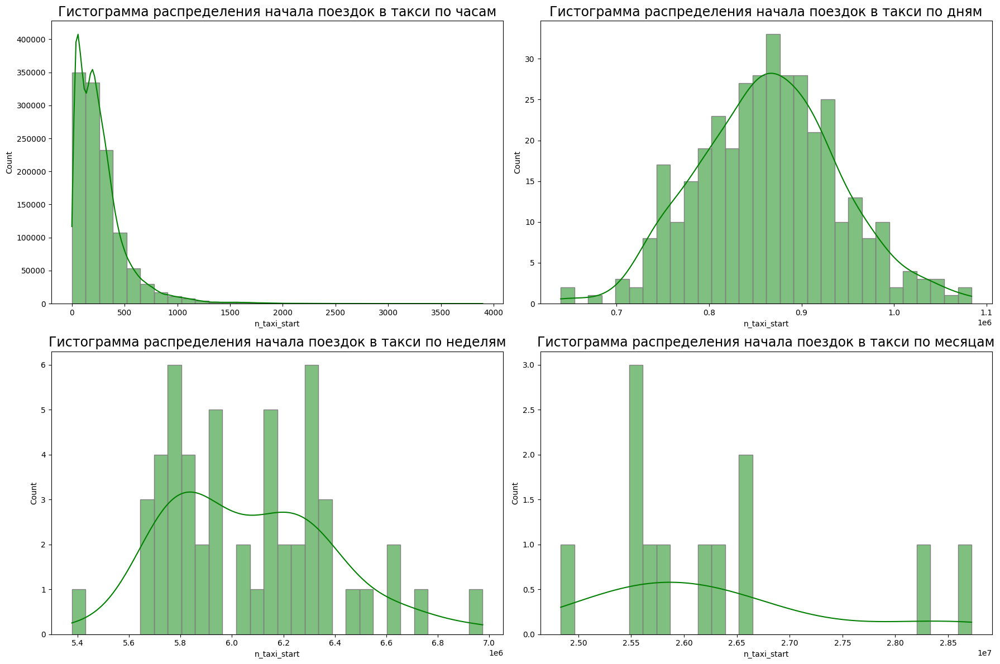

In [95]:
plt.figure(figsize=(18, 12))

plt.subplot(2, 2, 1)
sns.histplot(main_df.n_taxi_start, bins=30, color='green', edgecolor='gray', kde=True)
plt.title('Гистограмма распределения начала поездок в такси по часам', fontsize=17)

plt.subplot(2, 2, 2)
sns.histplot(df_daily.n_taxi_start, bins=30, color='green', edgecolor='gray', kde=True)
plt.title('Гистограмма распределения начала поездок в такси по дням', fontsize=17)

plt.subplot(2, 2, 3)
sns.histplot(df_weekly.n_taxi_start, bins=30, color='green', edgecolor='gray', kde=True)
plt.title('Гистограмма распределения начала поездок в такси по неделям', fontsize=17)

plt.subplot(2, 2, 4)
sns.histplot(df_monthly.n_taxi_start, bins=30, color='green', edgecolor='gray', kde=True)
plt.title('Гистограмма распределения начала поездок в такси по месяцам', fontsize=17)

plt.tight_layout()
plt.show()

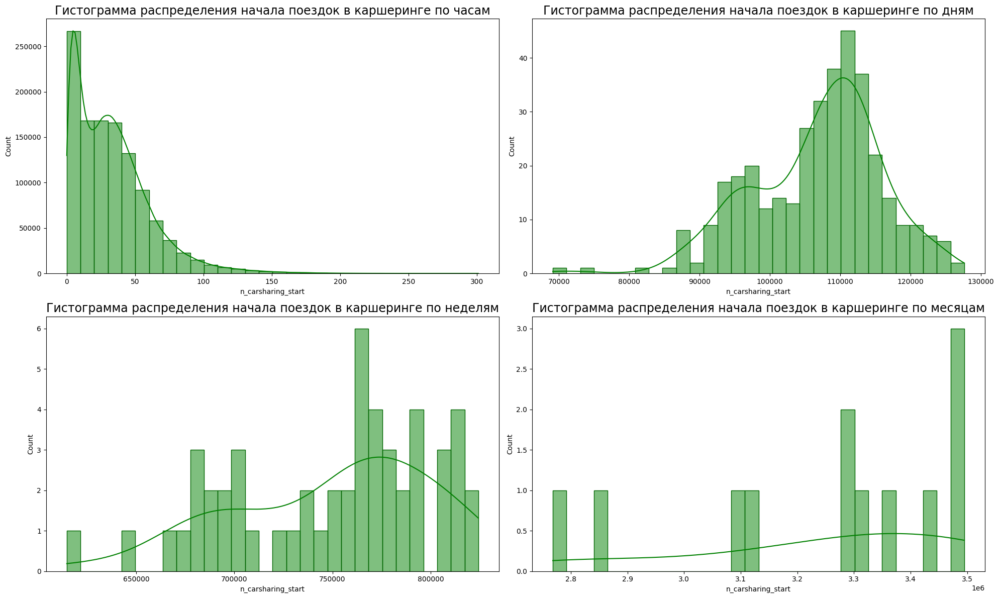

In [96]:
plt.figure(figsize=(20, 12))

plt.subplot(2, 2, 1)
sns.histplot(main_df.n_carsharing_start, bins=30, color='green', edgecolor='darkgreen', kde=True)
plt.title('Гистограмма распределения начала поездок в каршеринге по часам', fontsize=17)

plt.subplot(2, 2, 2)
sns.histplot(df_daily.n_carsharing_start, bins=30, color='green', edgecolor='darkgreen', kde=True)
plt.title('Гистограмма распределения начала поездок в каршеринге по дням', fontsize=17)

plt.subplot(2, 2, 3)
sns.histplot(df_weekly.n_carsharing_start, bins=30, color='green', edgecolor='darkgreen', kde=True)
plt.title('Гистограмма распределения начала поездок в каршеринге по неделям', fontsize=17)

plt.subplot(2, 2, 4)
sns.histplot(df_monthly.n_carsharing_start, bins=30, color='green', edgecolor='darkgreen', kde=True)
plt.title('Гистограмма распределения начала поездок в каршеринге по месяцам', fontsize=17)

plt.tight_layout()
plt.show()


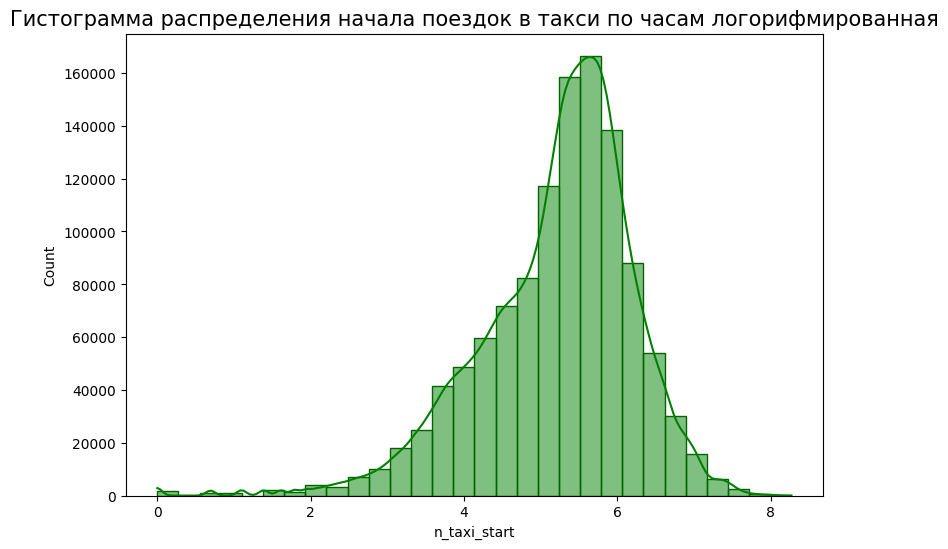

In [97]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Гистограмма распределения начала поездок в такси по часам логорифмированная', fontsize=15)
sns.histplot(np.log1p(main_df.n_taxi_start),
             bins=30,
             ax=ax,
             color='green',
             edgecolor='darkgreen',
             kde=True
            );

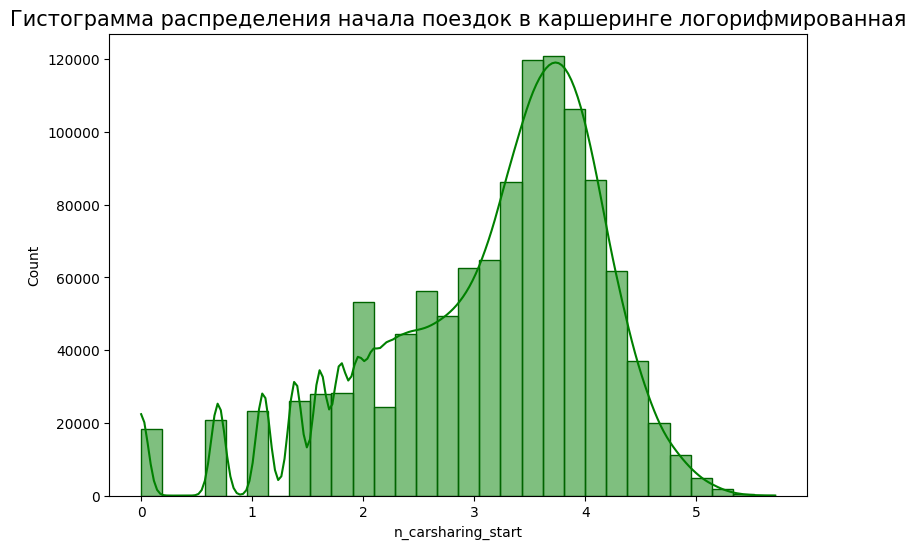

In [98]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Гистограмма распределения начала поездок в каршеринге логорифмированная', fontsize=15)
sns.histplot(np.log1p(main_df.n_carsharing_start),
             bins=30,
             ax=ax,
             color='green',
             edgecolor='darkgreen',
             kde=True
            );

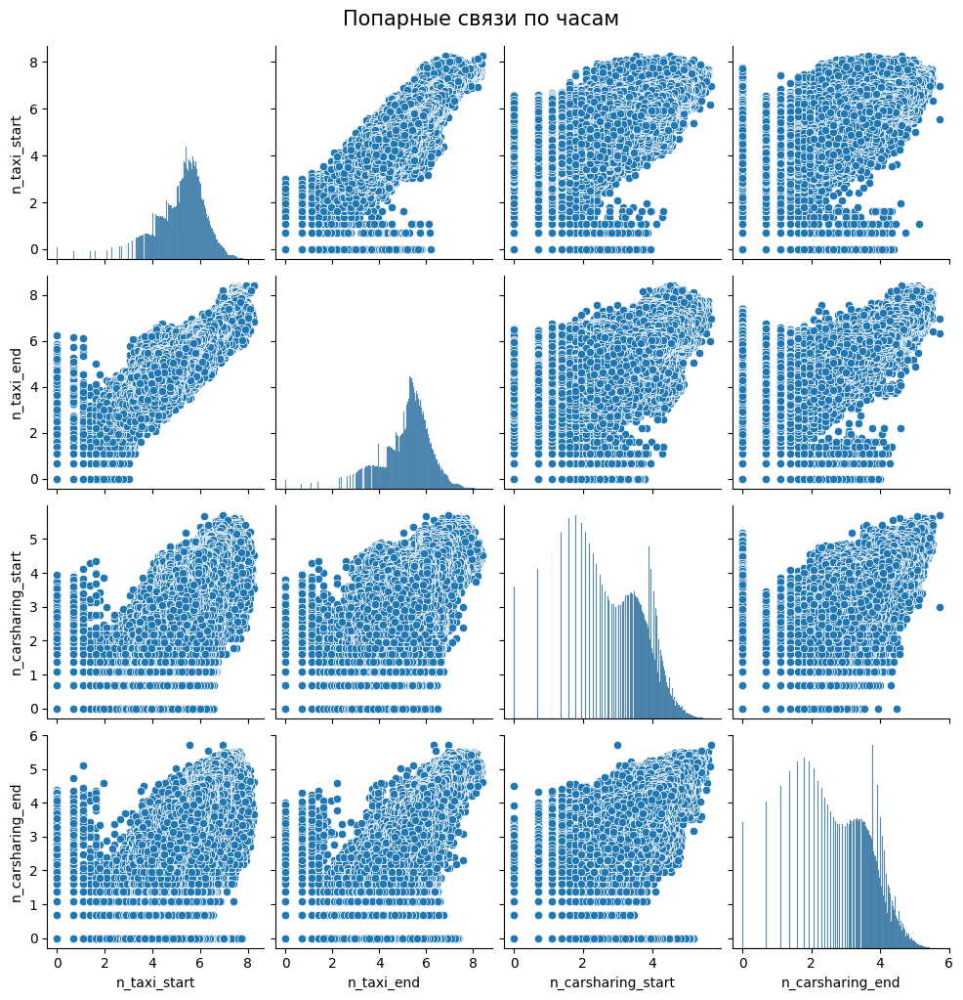

In [99]:
sns.pairplot(np.log1p(main_df[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']]))
plt.suptitle('Попарные связи по часам', fontsize=15, y=1.02)
plt.show()

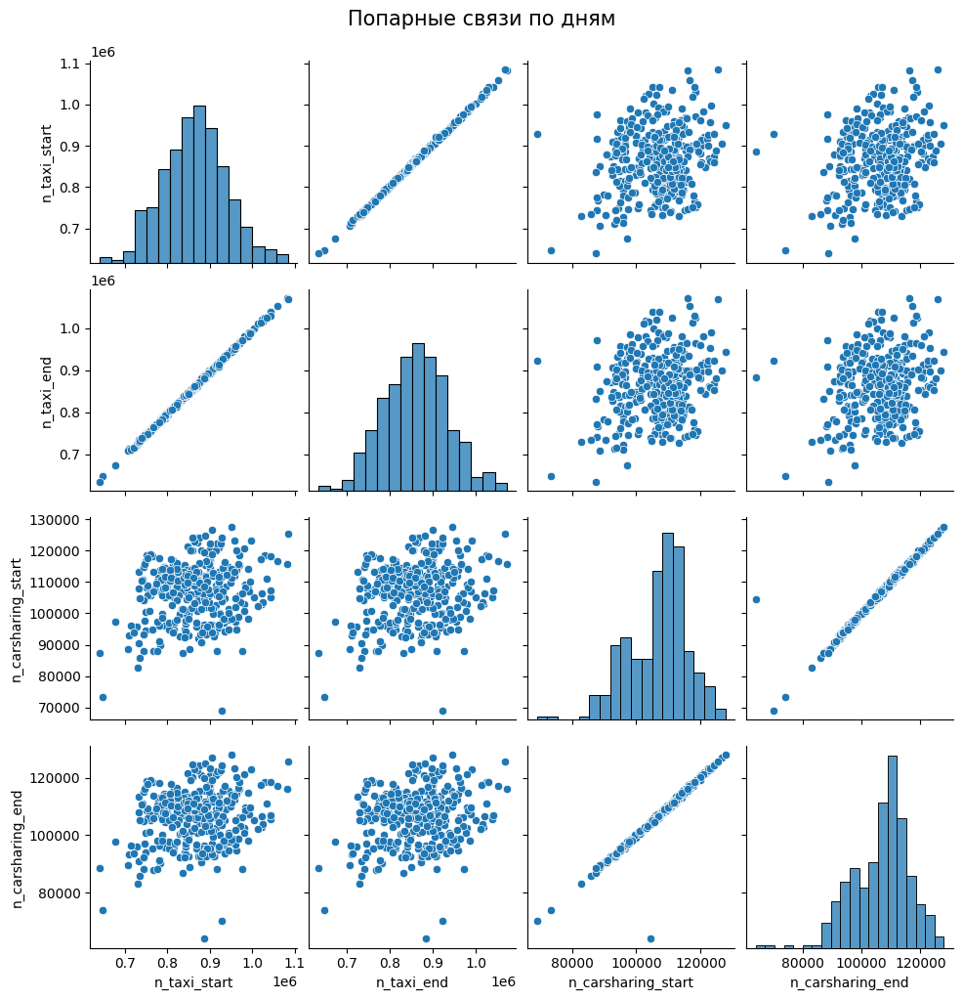

In [100]:
sns.pairplot(df_daily[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']])
plt.suptitle('Попарные связи по дням', fontsize=15, y=1.02)
plt.show()

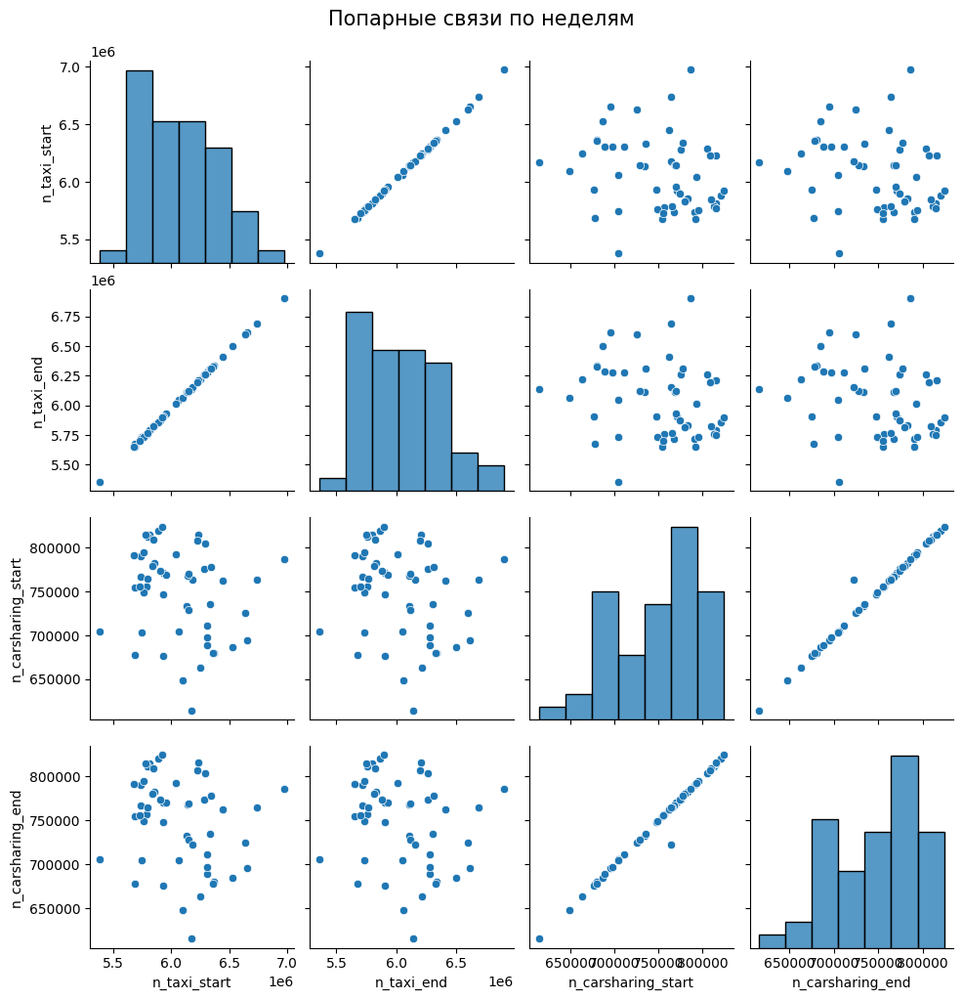

In [101]:
sns.pairplot(df_weekly[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']]);
plt.suptitle('Попарные связи по неделям', fontsize=15, y=1.02)
plt.show()

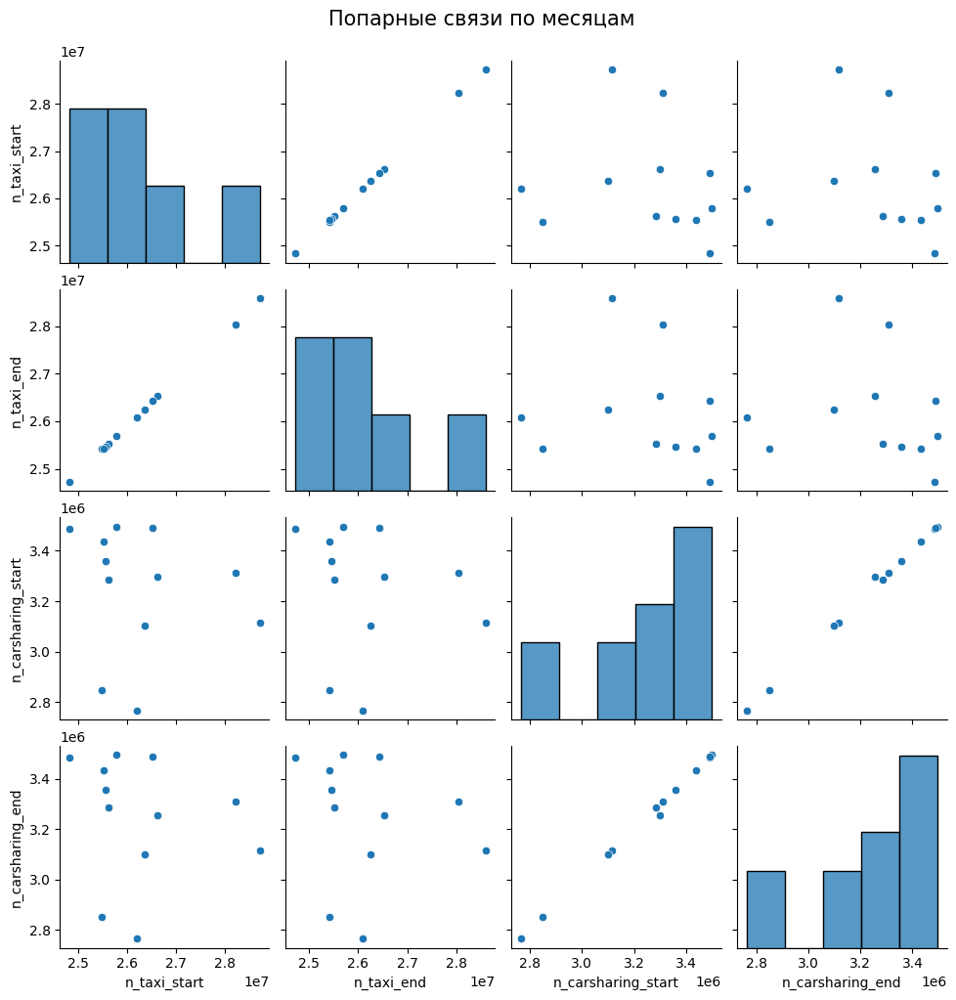

In [102]:
sns.pairplot(df_monthly[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']])
plt.suptitle('Попарные связи по месяцам', fontsize=15, y=1.02)
plt.show()

### Вывод по анализу распределения количества поездок в такси и каршеринге

В ходе предварительного анализа данных была выявлена **линейная зависимость** между количеством поездок в такси и количеством поездок в каршеринге. Это может свидетельствовать о том, что оба вида транспорта подчиняются схожим паттернам поведения пользователей — например, оба пиково используются в часы повышенного спроса (утром и вечером), и оба менее востребованы ночью. Такая взаимосвязь вполне логична, учитывая, что и такси, и каршеринг относятся к персональному транспорту по требованию.

#### Анализ распределений по временным интервалам

##### Почасовое распределение

На почасовом графике поездок в такси чётко видны **циклические суточные пики**:

- **Утренние пики** (~8:00–9:00);
- **Вечерние пики** (~17:00–19:00);
- **Минимум** активности — в **ночные часы** (0:00–5:00), где значения могут опускаться до **0 поездок**;
- **Пиковые значения** достигают **до 94,135 поездок в час**;
- Примерный диапазон "типичной активности" — от **18,000 до 47,000** поездок в час.

В каршеринге:
- **Медиана**: 4,912.5.
- **Нулевые значения**: Наблюдаются в ночные часы.  
- **Рекомендация**: Логарифмирование для анализа.

Это указывает на стабильность активности на дневном уровне. Колебания, вызванные внешними факторами (например, погодой, событиями), сглаживаются, и поведение пользователей становится **предсказуемым**. Такие данные можно использовать в моделях прогнозирования **временных рядов** без трансформаций.

Это подчёркивает выраженный **циркадный ритм** в пользовательском поведении, который следует учитывать при построении моделей прогнозирования и оптимизации ресурсного распределения (например, планирования парка машин).


Наиболее интересным оказалось распределение количества поездок **по часам**. Оно имеет ярко выраженный сдвиг к нулю, особенно в ночное время. В некоторых районах Москвы в определённые часы (например, после полуночи до 5 утра) количество поездок может быть нулевым. Это приводит к асимметрии и смещению распределения влево, что делает его далеким от нормального. 

В связи с этим было принято решение **применить логарифмирование** данных, чтобы:

- снизить влияние нулевых и экстремально низких значений;
- получить более симметричное распределение;
- облегчить последующее моделирование и визуализацию.

Также стоит отметить, что **биполярность активности** по районам столицы играет важную роль: в центральных и деловых районах спрос сохраняется даже в ночное время, в то время как в спальных и окраинных районах наблюдаются длинные периоды полной тишины. Это ещё больше усиливает асимметрию.

##### Распределения по дням

На дневном графике поездок в такси:

- **Минимум**: **639,521** поездок;
- **Максимум**: **1,083,859**;
- **Медиана**: **864,981**;
- **Среднее значение**: **864,460**;
- Распределение **близко к нормальному**.
  
В каршеринге:
- **Медиана**: 108.3 тыс.
- **Разброс**: 69.1 тыс. (min) – 127.6 тыс. (max).  

Распределение количества поездок **по дням** оказалось намного ближе к нормальному. Вероятно, это связано с тем, что на суточном уровне случайные колебания (например, погодные условия, выходные и праздники) сглаживаются, и количество поездок подчиняется более устойчивым закономерностям. Это позволяет использовать такие данные для временных рядов и прогнозирования без предварительных трансформаций.

##### Распределения по неделям и месяцам


На графике с распределением количества поездок в такси (по неделям):

- **Минимум**: **5,377,567**;
- **Максимум**: **6,974,526**;
- **Медиана**: **6,050,866**;
- **Среднее**: **6,067,850**;
- Наблюдается **умеренная асимметрия**, хотя распределение более сглажено.

Каршеринг:
- **Медиана**: 3.30 млн.
- **Разброс**: 2.77 млн. (min) – 3.50 млн. (max).  
- **Вывод**: Стабильный спрос с небольшими сезонными колебаниями.

**недельное и месячное распределение** демонстрируют более выраженную ненормальность. Возможные причины:

- Праздничные и выходные недели, которые значительно выбиваются по уровню активности;
- Сезонность (например, летом — рост числа поездок, зимой — снижение);
- Наличие выбросов — хотя они и не критичны (все лежат в пределах трёх сигм), но в совокупности искажают форму распределения.

#### Наличие повторяющихся суточных паттернов

Особое внимание стоит уделить **чётко выраженным суточным паттернам поведения** пользователей. Они проявляются в виде пиков и спадов активности в течение суток:

- **Утренние и вечерние пики** — соответствуют времени поездок на работу и с работы;
- **Небольшой подъём днём** — скорее всего, отражает поездки на обед или встречи;
- **Ночное падение спроса** — естественное явление, когда большинство пользователей отдыхают и количество поездок минимально.

Такой характер распределения подтверждает, что пользовательское поведение в течение суток повторяется с высокой степенью стабильности. Это даёт возможность использовать модели, ориентированные на **циркадные ритмы**, и строить прогнозы на основе типичного поведения по часам суток.

#### Выводы

1. Распределения по часам требуют трансформации из-за смещения и наличия нулевых значений.
2. Дневные данные приближаются к нормальному распределению и удобны для статистического анализа.
3. В данных есть выбросы, но они укладываются в статистические границы (±3σ).
4. Поведение пользователей демонстрирует чёткую цикличность, особенно в рамках суток.
5. Пространственные различия (между районами) и временные факторы (день недели, сезон) важно учитывать в дальнейшей аналитике и моделировании.


In [104]:
corr_hourly_matrix = main_df[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']].corr(method='spearman')

corr_matrix_flipped = corr_hourly_matrix.iloc[::-1]
z_text_flipped = np.round(corr_matrix_flipped.values, 2).astype(str)

z_min = corr_hourly_matrix.values.min()
z_max = corr_hourly_matrix.values.max()

# Строим график
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix_flipped.values,
    x=corr_matrix_flipped.columns,
    y=corr_matrix_flipped.index,
    colorscale='Greens',
    zmin=z_min,
    zmax=z_max,
    text=z_text_flipped,
    texttemplate="%{text}",
    textfont={"size":14, "color":"black"},
    showscale=True
))

fig.update_layout(
    title='Корреляционная матрица поездок по часам (метод Спирмена)',
    title_x=0.5,
    width=800,
    height=600,
    xaxis_title='Переменные',
    yaxis_title='Переменные',
    font=dict(size=14)
)

fig.show()


In [105]:
corr_daily_matrix = df_daily[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']].corr(method='pearson')

corr_matrix_flipped = corr_daily_matrix.iloc[::-1]
z_text_flipped = np.round(corr_matrix_flipped.values, 2).astype(str)

# Строим график
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix_flipped.values,
    x=corr_matrix_flipped.columns,
    y=corr_matrix_flipped.index,
    colorscale='Greens',
    text=z_text_flipped,
    texttemplate="%{text}",
    textfont={"size":14, "color":"black"},
    showscale=True
))

fig.update_layout(
    title='Корреляционная матрица поездок по дням (метод Пирсона)',
    title_x=0.5,
    width=800,
    height=600,
    xaxis_title='Переменные',
    yaxis_title='Переменные',
    font=dict(size=14)
)

fig.show()


In [106]:
corr_weekly_matrix = df_weekly[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']].corr(method='spearman')

corr_matrix_flipped = corr_weekly_matrix.iloc[::-1]
z_text_flipped = np.round(corr_matrix_flipped.values, 2).astype(str)

# Строим график
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix_flipped.values,
    x=corr_matrix_flipped.columns,
    y=corr_matrix_flipped.index,
    colorscale='Greens',
    text=z_text_flipped,
    texttemplate="%{text}",
    textfont={"size":14, "color":"black"},
    showscale=True
))

fig.update_layout(
    title='Корреляционная матрица поездок по неделям (метод Спирмена)',
    title_x=0.5,
    width=800,
    height=600,
    xaxis_title='Переменные',
    yaxis_title='Переменные',
    font=dict(size=14)
)

fig.show()


In [107]:
corr_monthly_matrix = df_monthly[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']].corr(method='spearman')

corr_matrix_flipped = corr_monthly_matrix.iloc[::-1]
z_text_flipped = np.round(corr_matrix_flipped.values, 2).astype(str)

# Строим график
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix_flipped.values,
    x=corr_matrix_flipped.columns,
    y=corr_matrix_flipped.index,
    colorscale='Greens',
    text=z_text_flipped,
    texttemplate="%{text}",
    textfont={"size":14, "color":"black"},
    showscale=True
))

fig.update_layout(
    title='Корреляционная матрица поездок по месяцам (метод Спирмена)',
    title_x=0.5,
    width=800,
    height=600,
    xaxis_title='Переменные',
    yaxis_title='Переменные',
    font=dict(size=14)
)

fig.show()


### Вывод о поведении корреляции между поездками такси и каршеринга при разной агрегации по времени

На основании анализа корреляционных матриц можно сделать следующие наблюдения и выводы относительно взаимосвязи между количеством поездок в такси и каршеринге:

#### 1. **Почасовая корреляция (с 0.7 по 0.8):**
Корреляция между такси и каршерингом по часам является **высокой и положительной**, что говорит о схожем поведении спроса в рамках суток. Это отражает наличие устойчивых **суточных паттернов**, таких как:
- Утренние и вечерние пики (поездки на работу и с работы);
- Дневные умеренные повышения (поездки по делам, на обед и т.д.);
- Ночные спады (снижение активности в 1:00–5:00).

Обе услуги (такси и каршеринг) реагируют на **одинаковую структуру поведения горожан**, что объясняет сильную синхронность активности в течение суток.

#### 2. **Агрегация по дням (с 0.18 по 0.19):**
После агрегирования данных по дням корреляция **резко ослабевает**. Это указывает на то, что **краткосрочные колебания** и локальные пики сглаживаются, а **долгосрочная динамика** у двух сервисов начинает отличаться.

Причины ослабления:
- Услуги такси и каршеринга могут по-разному реагировать на **внешние события** (погода, праздники, пробки);
- Различия в стратегии использования: такси более востребовано в плохую погоду или ночью, тогда как каршеринг — больше днём и при хороших условиях;
- Суммирование по дням **сглаживает внутрисуточные пики**, где и наблюдалась основная синхронность.

#### 3. **Агрегация по неделям (с –0.26 по –0.27):**
На недельном уровне корреляция становится **отрицательной**, что может указывать на **противоположные тренды**. Это может происходить из-за:
- **Конкуренции между сервисами**: рост активности одного может сопровождаться снижением другого;
- **Нерегулярного распределения спроса**: например, в выходные пользователи могут предпочесть каршеринг для выезда за город, а в будни — такси для работы;

#### 4. **Агрегация по месяцам (с –0.15 по –0.19):**
На месячном уровне корреляция остаётся **слабой и отрицательной**. Это объясняется тем, что:
- **Количество точек наблюдений всего 12**, и этого недостаточно для устойчивых статистических выводов;
- Поведение пользователей на месячном уровне подвержено влиянию **сезонных факторов**, изменений в ценовой политике, акций, доступности автомобилей и т.д.;
- Агрегация на этом уровне **теряет поведенческие паттерны**, чётко видимые только на почасовой/посуточной детализации.

---

### Общий вывод:
Сильная корреляция между количеством поездок в такси и каршеринге наблюдается только при **высокой временной детализации** (по часам), где ярко выражены поведенческие паттерны. При укрупнении временных интервалов зависимость между сервисами ослабевает или становится отрицательной, что отражает различия в **макротенденциях**, **спросе** и **сценариях использования** двух типов транспортных услуг.

Таким образом, **взаимосвязь между такси и каршерингом носит поведенческий и краткосрочный характер**, но **на долгосрочном уровне поведение пользователей существенно расходится**.


### Анализ распределения поездок на такси и каршеринге по административным округам Москвы

На двух представленных картах визуализированы данные по количеству поездок на **каршеринге** и **такси** в различных административных округах Москвы. Цветовая шкала отражает интенсивность поездок: от светло-жёлтого (наименьшее количество) до тёмно-красного (наибольшее количество).

#### Основные наблюдения:

##### 1. **Центральный административный округ (ЦАО):**
- **Каршеринг:** Каршеринг менее востребован в центральном округе чем в других: Южный, Юго-Восточный и Западный
- **Такси:** Один из лидеров по количеству поездок. Округ окрашен в тёмно-красный цвет, что говорит о высокой популярности каршеринга.
- 
**Вывод:** Центральный округ — ключевая зона транспортной активности, где пользователи активно пользуются обоими видами транспорта, тем не менее, машину каршеринга здесь достаточно сложно найти из-за нехватки парковочных мест чтобы удовлетворить повышенный спрос, поэтому люди выбирают альтернативный вид транспорта - такси

##### 2. **Северный, Северо-Восточный, Восточный округа:**
- **Каршеринг:** Значительно более востребованы, округ окрашен в насыщенно-оранжевый цвет. 
- **Такси:** Эти округа тоже достаточно активны, но уступают по насыщенности цвета ЦАО.

**Вывод:** В данных округах наблюдается баланс между использованием такси и каршеринга, но всё же с некоторым уклоном в сторону каршеринга (поскольку цветовая насыщенность выше для каршеринга).

##### 3. **Западный, Южный и Юго-Восточный округа:**
- **Каршеринг:** Эти округа имеют наивысший уровень использования каршеринга (красный цвет).
- **Такси:** Значительно менее востребованы по сравнению с каршерингом, округ окрашен в оранжевый цвет.

**Вывод:** В южных округах Москвы жители предпочитают каршеринг такси, возможно из-за экономико-социальных факторов, хорошая идея для гипотезы.

##### 4. **Троицкий и Новомосковский административные округа (ТиНАО):**
- **Каршеринг:** - Хоть и окрашены в бледные цвета, объёмы поездок на каршеринге в новомосковском оранжевого цвета.
- **Такси:** Минимальный уровень использования — бледно-жёлтые тона.

**Вывод:** В Троицком округе Москвы использование каршеринга практически отсутствует, но такси остаётся востребованным, вероятно, из-за удалённости от метро и из-за меньшего покрытия каршеринговыми сервиса, в Новомосковском каршерингом пользуются охотнее чем такси

#### Общие выводы:
- **Такси** остаётся более универсальным и популярным видом транспорта, особенно в центральных округах.
- **Каршеринг** наиболее развит и востребован в близлежащих округах, что может быть связано с плотностью населения, наличием парковок и зон допуска.

#### Инсайты:
- Увеличение числа каршеринговых машин в центральных и новых округах может поспособствовать более равномерному распределению поездок.
- Необходима инфраструктурная поддержка (парковки, льготы, доступность) для роста каршеринга в новых округах Москвы.
- Стоит провести дополнительное исследование причин низкой популярности каршеринга в южных округах и ТиНАО (возможно, экономические факторы или недостаточная информированность жителей).

In [ ]:
# Сгруппируем данные по районам
district_pivot = main_df.pivot_table(index='district_name', # группируем по районам
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end', 
                            'population_district_2023', 
                            'population_near_metro_cnt',
                            'population_near_metro'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                             'population_district_2023': 'first',  # население района
                             'population_near_metro_cnt': 'first',# население живущее в близи метро
                             'population_near_metro':'first' # % насления живущего в близи метро
                            }).reset_index()
district_pivot.head()

,district_name,n_carsharing_end,n_carsharing_start,n_taxi_end,n_taxi_start,population_district_2023,population_near_metro,population_near_metro_cnt
0,Академический район,265818,279824,2198948,2343298,117048,0.717789,84016.0
1,Алексеевский район,276915,305120,2079510,2309977,58696,0.584252,34293.0
2,Алтуфьевский район,107545,107602,542264,563139,86564,0.257881,22323.0
3,Бабушкинский район,223943,225397,1477605,1467702,95369,0.684008,65233.0
4,Басманный район,587544,571383,7137463,7651951,110726,0.819225,90709.0


In [ ]:
def plot_choropleth_trips(df, geojson_data, metric_column, district_column='district_name', title='', toolips=''):
    """
    Строит хороплет-карту по районам Москвы на основе количества поездок.

    Параметры:
    df (DataFrame): таблица со столбцами [district_column, metric_column].
    geojson_data (dict): GeoJSON с границами районов.
    metric_column (str): название колонки с метрикой (например, 'n_taxi_start' или 'n_carsharing_start').
    district_column (str): название колонки с названием района в df.
    title (str): заголовок карты.
    
    Возвращает:
    folium.Map: интерактивная карта.
    """
    
    # Преобразуем в словарь для быстрого поиска
    trip_data = dict(zip(df[district_column], df[metric_column]))

    # Добавляем значения метрики в свойства GeoJSON
    for feature in geojson_data['features']:
        district_name = feature['properties']['name']
        feature['properties'][metric_column] = trip_data.get(district_name, 0)

    # Создаем карту
    moscow_lat, moscow_lng = 55.751244, 37.618423
    m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

    # Хороплет-слой
    Choropleth(
        geo_data=geojson_data,
        data=df,
        columns=[district_column, metric_column],
        key_on='feature.properties.name',
        fill_color='YlOrRd',
        fill_opacity=0.8,
        line_opacity=0.2,
        legend_name=f'{metric_column} по районам'
    ).add_to(m)

    # Всплывающие подсказки
    folium.GeoJson(
        geojson_data,
        style_function=lambda feature: {
            "fillColor": "transparent",
            "color": "black",
            "weight": 1,
            "fillOpacity": 0
        },
        tooltip=folium.GeoJsonTooltip(
            fields=["name", metric_column],
            aliases=["Район", toolips],
            localize=True,
            sticky=False
        )
    ).add_to(m)

    # HTML-заголовок карты
    if title:
        title_html = f'''
             <h3 align="center" style="font-size:20px"><b>{title}</b></h3>
        '''
        m.get_root().html.add_child(Element(title_html))

    # Скрываем "Leaflet" внизу
    css = """
    <style>
    .leaflet-control-attribution {
        display: none !important;
    }
    </style>
    """
    m.get_root().html.add_child(Element(css))

    return m

In [ ]:
plot_choropleth_trips(district_pivot, 
                      msc_borders_clean,
                      'n_taxi_start', 
                      title='Карта распределения начатых поездок на такси по районам Москвы',
                      toolips='Количество поездок')

In [ ]:
# # Преобразуем в словарь для быстрого поиска по названию района
# taxi_start_trip = dict(zip(district_pivot['district_name'], district_pivot['n_taxi_start']))

# # Добавляем количесво поездок в свойства районов GeoJSON
# for feature in msc_borders_clean['features']:
#     district_name = feature['properties']['name']
#     feature['properties']['n_taxi_start'] = taxi_start_trip.get(district_name)

# # Создаем карту Москвы
# moscow_lat, moscow_lng = 55.751244, 37.618423
# m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# # Добавляем хороплет-карту с количеством поездок
# choropleth = Choropleth(
#     geo_data=msc_borders_clean,
#     data=taxi_start_trip,
#     columns=['district_name', 'n_taxi_start'],
#     key_on='feature.properties.name',  # Связываем с name в GeoJSON
#     fill_color='YlOrRd',  # Цветовая гамма (желтый -> оранжевый -> красный)
#     fill_opacity=0.8,
#     line_opacity=0.2,
#     legend_name='Количество начатых поездок'
# ).add_to(m)

# # Добавляем всплывающую информацию при наведении на район
# folium.GeoJson(
#     msc_borders_clean,
#     style_function=lambda feature: {
#         "fillColor": "transparent",
#         "color": "black",
#         "weight": 1,
#         "fillOpacity": 0
#     },
#     tooltip=folium.GeoJsonTooltip(
#         fields=["name", "n_taxi_start"],
#         aliases=["Район", "Население района, человек"],
#         localize=True,
#         sticky=False
#     )
# ).add_to(m)

# # HTML-заголовок карты
# title_html = '''
#      <h3 align="center" style="font-size:20px"><b>Карта распределения начатых поездок на такси по районам Москвы</b></h3>
# '''
# m.get_root().html.add_child(Element(title_html))


# from branca.element import Element
# # CSS для скрытия надписи Leaflet
# css = """
# <style>
# .leaflet-control-attribution {
#     display: none !important;
# }
# </style>
# """
# # Добавляем стиль на карту
# m.get_root().html.add_child(Element(css))
# # Отображаем карту

# m

In [ ]:
plot_choropleth_trips(district_pivot, 
                      msc_borders_clean,
                      'n_carsharing_start', 
                      title='Карта распределения начатых поездок в каршеринге по районам Москвы')

In [ ]:
# # Преобразуем в словарь для быстрого поиска по названию района
# carsharing_start_trip = dict(zip(district_pivot['district_name'], district_pivot['n_carsharing_start']))

# # Добавляем количество поездок в свойства районов GeoJSON
# for feature in msc_borders_clean['features']:
#     district_name = feature['properties']['name']
#     feature['properties']['n_carsharing_start'] = carsharing_start_trip.get(district_name)

# # Создаем карту Москвы
# moscow_lat, moscow_lng = 55.751244, 37.618423
# m_car = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# # Добавляем хороплет-карту с количеством поездок в каршеринге
# choropleth = Choropleth(
#     geo_data=msc_borders_clean,
#     data=carsharing_start_trip,
#     columns=['district_name', 'n_carsharing_start'],
#     key_on='feature.properties.name',
#     fill_color='YlOrRd', 
#     fill_opacity=0.8,
#     line_opacity=0.2,
#     legend_name='Количество начатых поездок в каршеринге'
# ).add_to(m_car)

# # Добавляем всплывающую информацию при наведении на район
# folium.GeoJson(
#     msc_borders_clean,
#     style_function=lambda feature: {
#         "fillColor": "transparent",
#         "color": "black",
#         "weight": 1,
#         "fillOpacity": 0
#     },
#     tooltip=folium.GeoJsonTooltip(
#         fields=["name", "n_carsharing_start"],
#         aliases=["Район", "Количество поездок в каршеринге"],
#         localize=True,
#         sticky=False
#     )
# ).add_to(m_car)

# # HTML-заголовок карты
# title_html = '''
#      <h3 align="center" style="font-size:20px"><b>Карта распределения начатых поездок в каршеринге по районам Москвы</b></h3>
# '''
# m_car.get_root().html.add_child(Element(title_html))

# # CSS для скрытия надписи Leaflet
# css = """
# <style>
# .leaflet-control-attribution {
#     display: none !important;
# }
# </style>
# """
# m_car.get_root().html.add_child(Element(css))

# # Отображаем карту
# m_car

In [ ]:
# Данные о ТОП-5 районах, с начатыми поездками в такси
taxi_data = (main_df.groupby('district_name')['n_taxi_start']
                    .sum()
                    .reset_index())
taxi_data = (taxi_data.rename(columns={'n_taxi_start': 'n_taxi_start_sum'})
                .sort_values(by='n_taxi_start_sum', ascending=False)
                .head(5))
taxi_data = taxi_data.sort_values(by='n_taxi_start_sum', ascending=True)

# Данные о ТОП-5 районах, с начатыми поездками в каршеринге
carsharing_data = (main_df.groupby('district_name')['n_carsharing_start']
                         .sum()
                         .reset_index())
carsharing_data = (carsharing_data.rename(columns={'n_carsharing_start': 'n_carsharing_start_sum'})
                                 .sort_values(by='n_carsharing_start_sum', ascending=False)
                                 .head(5))
carsharing_data = carsharing_data.sort_values(by='n_carsharing_start_sum', ascending=True)

fig = make_subplots(
    rows=1, cols=2, 
    subplot_titles=('Топ 5 районов по такси', 'Топ 5 районов по каршерингу'),
)

fig.add_trace(go.Bar(
    y=taxi_data['district_name'],
    x=taxi_data['n_taxi_start_sum'],
    orientation='h',
    name='Такси',
    text=taxi_data['n_taxi_start_sum'].apply(lambda x: f'{x/1e6:.2f}M'),
    marker=dict(color='royalblue')
), row=1, col=1)


fig.add_trace(go.Bar(
    y=carsharing_data['district_name'],
    x=carsharing_data['n_carsharing_start_sum'],
    orientation='h',
    name='Каршеринг',
    text=carsharing_data['n_carsharing_start_sum'].apply(lambda x: f'{x/1e3:.0f}K'),
    marker=dict(color='firebrick')
), row=1, col=2)

fig.update_yaxes(side='right', row=1, col=2)

fig.update_layout(
    title='Топ 5 районов по количеству заказов такси и каршеринга за год',
    height=600,
    showlegend=False,
    yaxis=dict(title="Район"),
    xaxis1=dict(title="Количество заказов"),
    xaxis2=dict(title="Количество заказов")
)

fig.show()

В этих районах чаще всего заказывали такси за год.

In [ ]:
def plot_hourly_heatmap(df, metric_column, top_n=5, title=''):
    """
    Строит тепловую карту среднего количества поездок по часам для топ-N районов.

    Параметры:
    df (DataFrame): Датафрейм, содержащий колонки 'district_name', 'hour', и метрику.
    metric_column (str): Название столбца с метрикой (например, 'n_taxi_start').
    top_n (int): Сколько топ-районов по сумме метрики брать.
    title (str): Заголовок графика.

    Возвращает:
    fig: Plotly figure.
    """
    
    # Определяем топ-N районов по суммарной метрике
    top_districts = df.groupby('district_name')[metric_column].sum().nlargest(top_n).index
    filtered_df = df[df['district_name'].isin(top_districts)]

    # Среднее количество поездок по каждому часу и району
    pivot_df = filtered_df.groupby(['district_name', 'hour'])[metric_column].mean().reset_index()

    # Строим график
    fig = px.density_heatmap(
        pivot_df,
        x='hour',
        y='district_name',
        z=metric_column,
        color_continuous_scale='YlOrRd',
        title=title if title else f'Среднее количество поездок по часам (топ-{top_n} районов)',
        nbinsx=24
    )

    fig.update_layout(
        coloraxis_colorbar_title='Среднее<br>поездок в час',
        xaxis_title='Час дня',
        yaxis_title='Район',
        height=600
    )

    fig.update_traces(
        hovertemplate='Час: %{x}<br>Район: %{y}<br>Поездок: %{z:.0f}'
    )

    return fig

In [ ]:
plot_hourly_heatmap(main_df, 
                    'n_taxi_start', 
                    top_n=5, 
                    title='Среднее количество начатых поездок такси по часам (топ-5 районов)')

- Из Тверского района, чаще всего уезжают в вечерние и ночные часы, могу предположить, что в этом районе много тусовочных мест и люди поздно возращаются домой.
- В Пресненском районе наиболее активные часы с 9-22, в этом районе много офисов, поэтому активность выше в рабочее время.
- В Коммунарке активность выше в утренние (7-9) и вечерние (17-20) часы, возможно тут люди заказывают такси от/до метро.

In [ ]:
plot_hourly_heatmap(main_df, 
                    'n_carsharing_start', 
                    top_n=5, 
                    title='Среднее количество начатых поездок каршеринга по часам (топ-5 районов)')

- В Коммунарке явно раньше всего начинают брать каршеринг в прокат, скорее всего это связано с тем, что до работы дальше добираться, чем из других районов города.
- В среднем высокая активность с 8-21 вечера.
- Самые высокие средние значения в 18-19 часов в Пресненском и Даниловском районе.

In [ ]:
# Данные о ТОП-5 районах, с начатыми поездками в такси
taxi_data_adm_region = (main_df.groupby('administrative_region')['n_taxi_start']
                    .sum()
                    .reset_index())
taxi_data_adm_region = (taxi_data_adm_region.rename(columns={'n_taxi_start': 'n_taxi_start_sum'})
                .sort_values(by='n_taxi_start_sum', ascending=False)
                .head(5))
taxi_data_adm_region = taxi_data_adm_region.sort_values(by='n_taxi_start_sum', ascending=True)

# Данные о ТОП-5 районах, с начатыми поездками в каршеринге
carsharing_data_adm_region = (main_df.groupby('administrative_region')['n_carsharing_start']
                         .sum()
                         .reset_index())
carsharing_data_adm_region = (carsharing_data_adm_region.rename(columns={'n_carsharing_start': 'n_carsharing_start_sum'})
                                 .sort_values(by='n_carsharing_start_sum', ascending=False)
                                 .head(5))
carsharing_data_adm_region = carsharing_data_adm_region.sort_values(by='n_carsharing_start_sum', ascending=True)

fig = make_subplots(
    rows=1, cols=2, 
    subplot_titles=('Топ 5 округов по такси', 'Топ 5 округов по каршерингу'),
)

fig.add_trace(go.Bar(
    y=taxi_data_adm_region['administrative_region'],
    x=taxi_data_adm_region['n_taxi_start_sum'],
    orientation='h',
    name='Такси',
    text=taxi_data_adm_region['n_taxi_start_sum'].apply(lambda x: f'{x/1e6:.2f}M'),
    marker=dict(color='royalblue')
), row=1, col=1)


fig.add_trace(go.Bar(
    y=carsharing_data_adm_region['administrative_region'],
    x=carsharing_data_adm_region['n_carsharing_start_sum'],
    orientation='h',
    name='Каршеринг',
    text=carsharing_data_adm_region['n_carsharing_start_sum'].apply(lambda x: f'{x/1e6:.2f}М'),
    marker=dict(color='firebrick')
), row=1, col=2)

fig.update_yaxes(side='right', row=1, col=2)

fig.update_layout(
    title='Топ 5 округов по количеству заказов такси и каршеринга за год',
    height=600,
    showlegend=False,
    yaxis=dict(title="Административный округ"),
    xaxis1=dict(title="Количество заказов"),
    xaxis2=dict(title="Количество заказов")
)

fig.show()

В этих административных округах чаще всего заказывали такси и каршеринг за год.

**Вывод:** 
- Всего в данных 132 района и 12 округов, больше всего районов в Северо-Восточном округе - 17, меньше всего в Новомосковском округе - 2.
- В ТОП-5 по количеству начатых поездок такси входят такие районы как: Пресненский, Тверской, Басманный, Коммунарка и Хамовники.
- В ТОП-5 по количеству начатых поездок каршеринге входят такие районы как: Коммунарка, Пресненский, Даниловский, Марьино и Хорошёвский.
- В такси лидируют центральные в основном районы в центре города, кроме Коммунарки. В каршеринге же больше всего поездок в районах более удаленных от центра города. 

### Анализ поездок

In [ ]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

def plot_hourly_trip_distributions(df, start_col, end_col, title_prefix='Такси'):
    """
    Строит два графика распределения (start и end поездок) по часам — один под другим,
    и к каждому добавляет боксплот справа.

    Параметры:
    df (DataFrame): Датафрейм с колонкой 'timestamp' и метриками поездок.
    start_col (str): Название столбца со стартами поездок.
    end_col (str): Название столбца с окончаниями поездок.
    title_prefix (str): Текст в заголовке, например "Такси" или "Каршеринг".
    """

    # Агрегация по timestamp
    hourly_agg = df.groupby('timestamp')[[start_col, end_col]].sum().reset_index()

    # Создаем полотно: 2 строки, 2 колонки
    fig = make_subplots(
        rows=2, cols=2,
        shared_yaxes=False,
        column_widths=[0.7, 0.3],
        row_heights=[0.5, 0.5],
        specs=[[{"type": "xy"}, {"type": "box"}],
               [{"type": "xy"}, {"type": "box"}]],
        subplot_titles=[
            f'Распределение стартов ({title_prefix}) по часам за год',
            'Боксплот стартов',
            f'Распределение завершений ({title_prefix}) по часам за год',
            'Боксплот завершений'
        ]
    )

    # Гистограмма стартов
    hist_start = px.histogram(hourly_agg, x=start_col)
    for trace in hist_start['data']:
        trace.marker.color = 'royalblue'
        fig.add_trace(trace, row=1, col=1)

    # Боксплот стартов
    box_start = go.Box(x=hourly_agg[start_col], 
                       name='Старт', 
                       boxpoints='outliers', 
                       orientation='h',
                       marker_color='royalblue')
    fig.add_trace(box_start, row=1, col=2)

    # Гистограмма завершений
    hist_end = px.histogram(hourly_agg, x=end_col)
    for trace in hist_end['data']:
        trace.marker.color = 'firebrick'
        fig.add_trace(trace, row=2, col=1)

    # Боксплот завершений
    box_end = go.Box(x=hourly_agg[end_col], 
                     name='Завершение', 
                     boxpoints='outliers', 
                     orientation='h', 
                     marker_color='firebrick')
    fig.add_trace(box_end, row=2, col=2)

    fig.update_layout(
        height=800,
        width=1000,
        title_text=f'Распределения и боксплоты количества поездок за год по часам: {title_prefix}',
        showlegend=False
    )

    fig.update_traces(
        hovertemplate='Количество поездок: %{x}<br>Наблюдений: %{y}',
        selector=dict(type='histogram')
    )

    fig.update_xaxes(title_text='Количество поездок в час', row=2, col=1)
    fig.update_yaxes(title_text='Частота', row=1, col=1)
    fig.update_yaxes(title_text='Частота', row=2, col=1)

    return fig

In [ ]:
plot_hourly_trip_distributions(main_df, 'n_taxi_start', 'n_taxi_end')

**Начатые поездки:**
- Медианное количество поездок в час составило 41,51 тыс.
- Первый квартиль (Q1) — 21,15 тыс., третий квартиль (Q3) — 47,73 тыс.
- Минимальное значение — 0, наблюдаются 2 выброса со значениями более 90 тыс.

**Завершённые поездки:**
- Медианное количество завершённых поездок в час — 41,57 тыс.
- Q1 — 21,48 тыс., Q3 — 47,55 тыс.
- Минимум — 0, максимум достигает 99,83 тыс.

**Общие закономерности:**
- В распределении чётко прослеживаются многократно встречающиеся значения, что указывает на суточные паттерны поведения:
    - Пиковые значения в утренние и вечерние часы (поездки на работу/домой)
    - Умеренный рост днём (например, поездки на обед)
    - Существенные просадки ночью, когда спрос на поездки минимален

Посмотрим на выбросы:

In [ ]:
daily_trips = main_df.groupby('timestamp')[['n_taxi_start', 'n_taxi_end']].sum().reset_index()

daily_trips[daily_trips['n_taxi_start']>90000]

,timestamp,n_taxi_start,n_taxi_end
1881,2024-03-19 09:00:00,90629,94338
5774,2024-08-28 14:00:00,94135,99832


In [ ]:
def analyze_taxi_anomaly(main_df, anomaly_time, hour=14):
    """
    Анализирует аномалию в поездках такси по заданному часу и времени.
    Показывает всплеск по районам и сравнивает с медианой за аналогичный час.
    """

    print(f"\n=== Анализ выброса на {anomaly_time} ===")

    # Данные в момент выброса
    anomaly_df = main_df[main_df['timestamp'] == anomaly_time]
    trips_by_district = anomaly_df.groupby('district_name')['n_taxi_start'] \
                                  .sum().sort_values(ascending=False).rename('anomaly_value')

    # Данные по обычному шаблону в этот час
    df_hour = main_df[main_df['hour'] == hour]
    grouped = df_hour.groupby(['district_name', 'date'])['n_taxi_start'].sum().reset_index()
    medians = grouped.groupby('district_name')['n_taxi_start'].median().rename('median_hour')

    # Объединяем
    comparison = pd.concat([medians, trips_by_district], axis=1)
    comparison['ratio'] = comparison['anomaly_value'] / comparison['median_hour']
    comparison = comparison.sort_values(by='anomaly_value', ascending=False)

    # Погода в этот момент
    temp = main_df[main_df['timestamp'] == anomaly_time]['temperature'].mean().round(1)
    weather = main_df[main_df['timestamp'] == anomaly_time]['weather_code'].mode()[0]

    print(f"Средняя температура: {temp}°C")
    print(f"Код погоды: {weather}")
    print("\nТОП-15 районов по количеству поездок в момент аномалии:")
    print(comparison.head(15))

    return comparison

In [ ]:
analyze_taxi_anomaly(main_df, '2024-08-28 14:00:00', hour=14)


=== Анализ выброса на 2024-08-28 14:00:00 ===
Средняя температура: 25.5°C
Код погоды: 2

ТОП-15 районов по количеству поездок в момент аномалии:
                      median_hour  anomaly_value     ratio
district_name                                             
Тверской район             1214.0           3861  3.180395
Пресненский район          1474.0           3306  2.242877
район Хамовники             926.0           2285  2.467603
Таганский район             776.0           2182  2.811856
район Коммунарка            974.0           2073  2.128337
Мещанский район             651.0           1913  2.938556
Басманный район            1001.0           1894  1.892108
район Дорогомилово          596.0           1681  2.820470
район Раменки               846.0           1655  1.956265
Красносельский район        755.0           1653  2.189404
Даниловский район           761.0           1607  2.111695
район Замоскворечье         681.0           1578  2.317181
район Арбат                 

,median_hour,anomaly_value,ratio
district_name,,,
Тверской район,1214.0,3861,3.180395
Пресненский район,1474.0,3306,2.242877
район Хамовники,926.0,2285,2.467603
Таганский район,776.0,2182,2.811856
район Коммунарка,974.0,2073,2.128337
...,...,...,...
район Вороново,49.0,133,2.714286
район Силино,109.0,124,1.137615
район Бекасово,22.0,107,4.863636


Была хорошая солнечная погода, если бы был дождь можно было объяснитиь такой спрос осадками.

In [ ]:
analyze_taxi_anomaly(main_df, '2024-03-19 09:00:00', hour=9)


=== Анализ выброса на 2024-03-19 09:00:00 ===
Средняя температура: 2.0°C
Код погоды: 4

ТОП-15 районов по количеству поездок в момент аномалии:
                         median_hour  anomaly_value     ratio
district_name                                                
Пресненский район             1591.0           2796  1.757385
Тверской район                1006.0           1833  1.822068
район Раменки                 1023.0           1750  1.710655
район Хамовники               1052.0           1750  1.663498
район Коммунарка              1146.0           1682  1.467714
Таганский район                891.0           1589  1.783389
Даниловский район              978.0           1566  1.601227
Басманный район                942.0           1540  1.634820
Красносельский район          1002.0           1520  1.516966
район Хорошёво-Мнёвники       1047.0           1472  1.405922
Хорошёвский район              881.0           1422  1.614075
Можайский район                899.0           13

,median_hour,anomaly_value,ratio
district_name,,,
Пресненский район,1591.0,2796,1.757385
Тверской район,1006.0,1833,1.822068
район Раменки,1023.0,1750,1.710655
район Хамовники,1052.0,1750,1.663498
район Коммунарка,1146.0,1682,1.467714
...,...,...,...
район Капотня,116.0,161,1.387931
Краснопахорский район,96.0,117,1.218750
район Вороново,52.0,77,1.480769


In [ ]:
daily_trips[daily_trips['n_taxi_start']==0]

,timestamp,n_taxi_start,n_taxi_end
4525,2024-07-07 13:00:00,0,0
4526,2024-07-07 14:00:00,0,0


Какой-то баг на сервере, в эту дату и время нет информации о поездках.

In [ ]:
plot_hourly_trip_distributions(main_df, 'n_carsharing_start', 'n_carsharing_end', title_prefix='Каршеринг')

**Начатые поездки:**
- Медианное количество поездок в час составило 4912.
- Первый квартиль (Q1) — 2365, третий квартиль (Q3) — 6207.
- Минимальное значение — 0, выбросы отсутсвуют.

**Законченные поездки:**
- Медианное количество поездок в час составило 4807.
- Первый квартиль (Q1) — 2673, третий квартиль (Q3) — 6157.
- Минимальное значение — 0, выбросы отсутсвуют.

**Общие закономерности:**

В данных отчётливо выделяются две модальные зоны:
- около 700–800 поездок в час и 4800–4900 поездок в час
- Это подтверждает наличие суточных паттернов: минимальная активность ночью и выраженные пики в дневные и вечерние часы.

In [ ]:
daily_trips_carsharing = main_df.groupby('timestamp')[['n_carsharing_start', 'n_carsharing_end']].sum().reset_index()

daily_trips_carsharing[daily_trips_carsharing['n_carsharing_start']==0]

,timestamp,n_carsharing_start,n_carsharing_end
4525,2024-07-07 13:00:00,0,0
4526,2024-07-07 14:00:00,0,0


В тот же день и теже часы 0 поездок, думаю можем удалить эти строки из данных.

In [ ]:
mask_timestamps = daily_trips_carsharing.query('n_carsharing_start == 0')['timestamp']

# Удаляем данные в эту дату и время
main_df = main_df[~main_df['timestamp'].isin(mask_timestamps)]

In [ ]:
def plot_weekly_heatmap(df, metric_column, title=''):
    """
    Строит тепловую карту среднего количества поездок по неделям и дням недели.
    
    Параметры:
    df (DataFrame): исходный датафрейм, содержащий столбец 'timestamp' и метрику.
    metric_column (str): название столбца с метрикой (например, 'n_taxi_start').
    title (str): заголовок графика.
    
    Возвращает:
    fig: plotly figure
    """
    
    # Суммируем по дням
    daily_trips = df.groupby('timestamp')[metric_column].sum().reset_index()
    daily_trips = daily_trips.merge(df[['timestamp', 'week_number', 'day_name']].drop_duplicates(), on='timestamp', how='left')

    # Среднее по неделям и дням недели
    weekly_avg = daily_trips.groupby(['week_number', 'day_name'])[metric_column].mean().round().reset_index()

    # Группируем по неделе и дню недели и находим среднее
    weekly_avg = daily_trips.groupby(['week_number', 'day_name'])[metric_column].mean().round().reset_index()

    # Сортировка по неделям
    full_weeks = [str(i) for i in range(1, 53)]
    weekly_avg['week_number'] = weekly_avg['week_number'].astype(str)

    # Построение тепловой карты
    fig = px.density_heatmap(
        weekly_avg,
        x='week_number',
        y='day_name',
        z=metric_column,
        color_continuous_scale='YlOrRd',
        title=title,
        category_orders={
            'week_number': full_weeks,
            'day_name': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        }
    )

    fig.update_layout(
        coloraxis_colorbar_title='Среднее количество<br>поездок в час',
        xaxis_title='Номер недели',
        yaxis_title='День недели',
        height=600
    )
    fig.update_traces(hovertemplate='Номер недели: %{x}<br>День недели: %{y}<br>Количество поездок: %{z}')

    return fig

In [ ]:
plot_weekly_heatmap(main_df, 'n_taxi_start', 'Понедельное распределение поездок в такси')

- Пятница является самым активным днем на протяжении всего года, наименее активная в плане заказов была пятница 10.05.2024.
- Воскресенье является наименее активным днем на протяжении всего года.
- В более холодные месяцы активность в заказах выше, чем в более теплые месяцы.

In [ ]:
plot_weekly_heatmap(main_df, 'n_carsharing_start', 'Понедельное распределение поездок в каршеринге')

- Можно отметить, что за год среднее количество поездок в день выросло с 3.8к до 4.5к.
- В 43 неделю с понедельника по четверг видим заметное снижение поездок.
- Суббота является наиболее активным днем, возможно в выходные часто люди хотят куда-то выбраться.

In [ ]:
# Сгруппируем данные о начатых поездках в такси по дням недели
week_days_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

week_day_taxi_start = main_df.groupby('day_name')['n_taxi_start'].sum()
week_day_taxi_start = week_day_taxi_start.reindex(week_days_order).reset_index()

In [ ]:
# Сгруппируем данные о законченных поездках в такси по дням недели
week_day_taxi_end = main_df.groupby('day_name')['n_taxi_end'].sum()
week_day_taxi_end = week_day_taxi_end.reindex(week_days_order).reset_index()

In [ ]:
fig = make_subplots(rows=1, cols=2, subplot_titles=["Начатые поездки", "Законченные поездки"])

# График 1: Начатые поездки
fig.add_trace(
    go.Bar(
        x=week_day_taxi_start['day_name'], 
        y=week_day_taxi_start['n_taxi_start'],
        text=week_day_taxi_start['n_taxi_start'].apply(lambda x: f"{x:,.0f}".replace(",", " ")),
        textposition='outside',
        name="Начатые поездки",
        marker_color='royalblue'
    ), 
    row=1, col=1
)

# График 2: Законченные поездки
fig.add_trace(
    go.Bar(
        x=week_day_taxi_end['day_name'], 
        y=week_day_taxi_end['n_taxi_end'],
        text=week_day_taxi_end['n_taxi_end'].apply(lambda x: f"{x:,.0f}".replace(",", " ")),
        textposition='outside',
        name="Законченные поездки",
        marker_color='firebrick'
    ), 
    row=1, col=2
)

fig.update_layout(
    title_text="Поездки в такси по дням недели",
    showlegend=False,
    height=500, 
    width=1000,
    yaxis=dict(title="Количество поездок"),
    xaxis1=dict(title="День недели"),
    xaxis2=dict(title="День недели")
)

fig.update_yaxes(range=[40000000, 50000000])

fig.show()

- Можно заметить, что начатых поездок в каждый день недели больше, чем законченных, скорее всего имеются отмененные заказы или поездки которые прервались.
- Пятница является самым активным днем недели, в этот день больше всего заказов(на 5-20%).
- Воскресенье наименее активный день, поездок совершается значительно ниже, чем в другие дни недели(на 7-17%).

In [ ]:
# Сгруппируем данные о начатых поездках в каршеринге по дням недели
week_day_carsharing_start = main_df.groupby('day_name')['n_carsharing_start'].sum()
week_day_carsharing_start = week_day_carsharing_start.reindex(week_days_order).reset_index()

In [ ]:
# Сгруппируем данные о законченных поездках в каршеринге по дням недели
week_day_carsharing_end = main_df.groupby('day_name')['n_carsharing_end'].sum()
week_day_carsharing_end = week_day_carsharing_end.reindex(week_days_order).reset_index()

In [ ]:
# Создаем фигуру с двумя столбцовыми диаграммами
fig = make_subplots(rows=1, cols=2, subplot_titles=["Начатые поездки", "Законченные поездки"])

# График 1: Начатые поездки
fig.add_trace(
    go.Bar(
        x=week_day_carsharing_start['day_name'], 
        y=week_day_carsharing_start['n_carsharing_start'],
        text=week_day_carsharing_start['n_carsharing_start'].apply(lambda x: f"{x:,.0f}".replace(",", " ")),
        textposition='outside',
        name="Начатые поездки",
        marker_color='royalblue'
    ), 
    row=1, col=1
)

# График 2: Законченные поездки
fig.add_trace(
    go.Bar(
        x=week_day_carsharing_end['day_name'], 
        y=week_day_carsharing_end['n_carsharing_end'],
        text=week_day_carsharing_end['n_carsharing_end'].apply(lambda x: f"{x:,.0f}".replace(",", " ")),
        textposition='outside',
        name="Законченные поездки",
        marker_color='firebrick'
    ), 
    row=1, col=2
)

fig.update_layout(
    title_text="Поездки в каршеринге по дням недели",
    showlegend=False,
    height=500, 
    width=1000,
    yaxis=dict(title="Количество поездок"),
    xaxis1=dict(title="День недели"),
    xaxis2=dict(title="День недели")
)
fig.update_yaxes(range=[5000000, 6000000])

fig.show()

- Заметим, что в поездках каршеринга, есть дни недели, в которых законченных поездоик больше, чем начатых. Возможно в выходные дни сдают машины, которые брали в будни или предыдущий день.
- Пятница и суббота являются наиболее активными днями, в эти дни больше всего начатых поездок(на 5-7%). 

In [ ]:
# Сгруппируем начатые поездки в такси по месяцу 
month_taxi_start = main_df.groupby('month')['n_taxi_start'].sum()
month_taxi_start = month_taxi_start.reset_index()

In [ ]:
# Сгруппируем законченные поездки в такси по месяцу 
month_taxi_end = main_df.groupby('month')['n_taxi_end'].sum()
month_taxi_end = month_taxi_end.reset_index()

In [ ]:
# Создаем фигуру с двумя столбцовыми диаграммами
fig = make_subplots(rows=1, cols=2, subplot_titles=["Начатые поездки", "Законченные поездки"])

# График 1: Начатые поездки
fig.add_trace(
    go.Bar(
        x=month_taxi_start['month'], 
        y=month_taxi_start['n_taxi_start'],
        text=month_taxi_start['n_taxi_start'].apply(lambda x: f"{x:,.0f}".replace(",", " ")),
        textposition='outside',
        name="Начатые поездки",
        marker_color='royalblue'
    ), 
    row=1, col=1
)

# График 2: Законченные поездки
fig.add_trace(
    go.Bar(
        x=month_taxi_end['month'], 
        y=month_taxi_end['n_taxi_end'],
        text=month_taxi_end['n_taxi_end'].apply(lambda x: f"{x:,.0f}".replace(",", " ")),
        textposition='outside',
        name="Законченные поездки",
        marker_color='firebrick'
    ), 
    row=1, col=2
)

fig.update_layout(
    title_text="Поездки в такси по месяцам",
    showlegend=False,
    height=500, 
    width=1500,
    xaxis1=dict(tickmode='array',
                tickvals=month_taxi_end['month'],
                title="Номер месяца"),
    xaxis2=dict(tickmode='array',
                tickvals=month_taxi_end['month'],
                title="Номер месяца"),
    yaxis=dict(title="Количество поездок"),
    yaxis2=dict(title="Количество поездок")
)

fig.update_yaxes(range=[20000000, 30000000])

fig.show()

- Самыми активными месяцами являются март и декабрь.
- Наименьшее число заказов было в сентябре.

In [ ]:
# Сгруппируем начатые поездки в каршеринге по месяцу 
month_carsharing_start = main_df.groupby('month')['n_carsharing_start'].sum()
month_carsharing_start = month_carsharing_start.reset_index()

In [ ]:
# Сгруппируем законченные поездки в каршеринге по месяцу 
month_carsharing_end = main_df.groupby('month')['n_carsharing_end'].sum()
month_carsharing_end = month_carsharing_end.reset_index()

In [ ]:
# Создаем фигуру с двумя столбцовыми диаграммами
fig = make_subplots(rows=1, cols=2, subplot_titles=["Начатые поездки", "Законченные поездки"])

# График 1: Начатые поездки
fig.add_trace(
    go.Bar(
        x=month_carsharing_start['month'], 
        y=month_carsharing_start['n_carsharing_start'],
        text=month_carsharing_start['n_carsharing_start'].apply(lambda x: f"{x:,.0f}".replace(",", " ")),
        textposition='outside',
        name="Начатые поездки",
        marker_color='royalblue'
    ), 
    row=1, col=1
)

# График 2: Законченные поездки
fig.add_trace(
    go.Bar(
        x=month_carsharing_end['month'], 
        y=month_carsharing_end['n_carsharing_end'],
        text=month_carsharing_end['n_carsharing_end'].apply(lambda x: f"{x:,.0f}".replace(",", " ")),
        textposition='outside',
        name="Законченные поездки",
        marker_color='firebrick'
    ), 
    row=1, col=2
)

fig.update_layout(
    title_text="Поездки в каршеринге по месяцам",
    showlegend=False,
    height=500, 
    width=1500,
    xaxis1=dict(tickmode='array',
                tickvals=month_taxi_end['month'],
                title="Номер месяца"),
    xaxis2=dict(tickmode='array',
                tickvals=month_taxi_end['month'],
                title="Номер месяца"),
    yaxis=dict(title="Количество поездок"),
    yaxis2=dict(title="Количество поездок")
)

fig.update_yaxes(range=[2000000, 3800000])

fig.show()

- Можно заметить, что количество поездок в каршеринге за год практически постоянно растет, с небольшими просадками в некоторые месяцы.
- Август, сетябрь и ноябрь показали практически идентичные показатели около 3.5 млн поездок, если брать показатели на начало года в январе 2.8 млн, то поездок стало на 25% больше.
- Наименее активный месяц выдался - февраль.

In [ ]:
fig = make_subplots(rows=1, cols=1, specs=[[{"secondary_y": True}]], subplot_titles=["Динамика поездок (Такси и Каршеринг) по месяцам"])

# Такси - Начатые поездки (левая ось)
fig.add_trace(go.Scatter(
    x=month_taxi_start['month'], 
    y=month_taxi_start['n_taxi_start'],
    mode='lines+markers', 
    name="Такси - Начатые", 
    line=dict(color='royalblue', width=2)
), secondary_y=False)

# Каршеринг - Начатые поездки (правая ось)
fig.add_trace(go.Scatter(
    x=month_carsharing_start['month'], 
    y=month_carsharing_start['n_carsharing_start'],
    mode='lines+markers', 
    name="Каршеринг - Начатые", 
    line=dict(color='green', width=2, dash='dash')
), secondary_y=True)

fig.update_layout(
    title_text="Сравнение поездок (Такси vs Каршеринг)",
    height=600, width=900,
    xaxis=dict(title="Месяц"),
    yaxis=dict(title="Количество поездок (Такси)", showgrid=True),
    yaxis2=dict(title="Количество поездок (Каршеринг)", overlaying='y', side='right', showgrid=False),
    legend_title="Тип поездки"
)

fig.show()

- На этом графике можем заметить, что популярность каршеринговых сервисов растет, у такси же есть провалы в более теплые месяцы(с аперля по сентябрь).

### Анализ погодных факторов 

In [ ]:
def plot_weather_factors(df, metric_column, window, title='', ytitle=''):
    """
    Строит график средних значений фактора погоды за день с линией скользящего среднего.
    
    Параметры:
    df (DataFrame): исходный датафрейм, содержащий столбец 'timestamp' и метрику.
    metric_column (str): название столбца с метрикой (например, 'temperature').
    window (int): окно скальзящего среднего.
    title (str): заголовок графика.
    ytitle (str): подпись оси y.
    
    Возвращает:
    fig: plotly figure
    """
    factor = df.groupby(main_df['timestamp'].dt.date)[metric_column].mean().reset_index()

    fig = px.bar(factor, 
             y=metric_column,
             x='timestamp',
             labels={metric_column: ytitle, 'timestamp': 'Дата'},
                 )
    # Рассчитываем скользящее среднее
    factor['rolling_avg'] = factor[metric_column].rolling(window=window, min_periods=1).mean()

    # Добавляем линию тренда
    fig.add_trace(go.Scatter(
        x=factor['timestamp'],
        y=factor['rolling_avg'],
        mode='lines',
        name='Скользящее среднее',
        line=dict(color='red', width=2)
    ))

    fig.update_layout(title=title)
    return fig

In [ ]:
# Посмотрим на среднее показание температуры по дням
plot_weather_factors(main_df, 
                     'temperature', 
                     7, 
                     title='Распределение температуры по дням',
                     ytitle='Температура (°C)')

In [ ]:
# Посмотрим на среднее показание ветра по дням
plot_weather_factors(main_df, 
                     'wind_speed', 
                     7, 
                     title='Распределение скорости ветра по дням',
                     ytitle='Ветер, м/с')

In [ ]:
# Посмотрим на среднее показание влажности по дням
plot_weather_factors(main_df, 
                     'humidity', 
                     7, 
                     title='Распределение влажности по дням',
                     ytitle='Влажность, %')

In [ ]:
# Посмотрим какие значения принимает признак rush_hour
main_df['rush_hour'].unique()

array([0, 1, 2])

In [ ]:
main_df['rush_hour'].value_counts()

rush_hour
0    866976
1    144540
2    144540
Name: count, dtype: int64

## Рассмотрим зависимось количества поездок от населения

In [ ]:
# Построим матрицу корреляции
matrix_corr = district_pivot.set_index('district_name').corr().round(3)
matrix_corr

,n_carsharing_end,n_carsharing_start,n_taxi_end,n_taxi_start,population_district_2023,population_near_metro,population_near_metro_cnt
n_carsharing_end,1.000,0.986,0.861,0.863,0.592,0.301,0.538
n_carsharing_start,0.986,1.000,0.805,0.807,0.610,0.273,0.523
n_taxi_end,0.861,0.805,1.000,0.995,0.370,0.308,0.449
n_taxi_start,0.863,0.807,0.995,1.000,0.366,0.340,0.475
population_district_2023,0.592,0.610,0.370,0.366,1.000,0.001,0.463
population_near_metro,0.301,0.273,0.308,0.340,0.001,1.000,0.788
population_near_metro_cnt,0.538,0.523,0.449,0.475,0.463,0.788,1.000


In [ ]:
mask = np.tril(np.ones_like(matrix_corr, dtype=bool))
matrix_corr_masked = matrix_corr.where(mask)
matrix_corr_masked

fig = px.imshow(
    matrix_corr_masked,
    text_auto=True,
    color_continuous_scale='RdBu', 
    aspect="auto"
)


fig.update_traces(
    hovertemplate='%{z}<extra></extra>',
    xgap=1, 
    ygap=1,
    selector=dict(type='heatmap'),
    showscale=True
)


fig.update_layout(
    plot_bgcolor='white',
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=False),
    margin=dict(t=30, l=30, r=30, b=30)
)

fig.show()

In [ ]:
plot_choropleth_trips(district_pivot, 
                      msc_borders_clean,
                      'population_district_2023', 
                      title='Население районов Москвы',
                      toolips='Население')

In [ ]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=[
        'Зависимость начатых поездок в такси от населения', 
        'Зависимость законченных поездок в такси от населения',
        'Зависимость начатых поездок в каршеринге от населения',
        'Зависимость законченных поездок в каршеринге от населения'
    ]
)

# Первый график (Такси - Начатые поездки)
corr_1 = round(np.corrcoef(district_pivot['n_taxi_start'], district_pivot['population_district_2023'])[0, 1], 2)

fig.add_trace(
    go.Scatter(
        x=district_pivot['population_district_2023'],
        y=district_pivot['n_taxi_start'],
        mode='markers',
        marker=dict(color='royalblue'),
        name="Такси - Начатые"
    ),
    row=1, col=1
)

fig.add_annotation(
    xref="paper", yref="paper",
    x=0.05, y=0.95,
    text=f"Корреляция (Пирсон): {corr_1:.2f}",
    showarrow=False,
    font=dict(size=14, color="black"),
    bgcolor="white",
    bordercolor="black",
    borderwidth=1,
    row=1, col=1
)

# Второй график (Такси - Законченные поездки)
corr_2 = round(np.corrcoef(district_pivot['n_taxi_end'], district_pivot['population_district_2023'])[0, 1], 2)

fig.add_trace(
    go.Scatter(
        x=district_pivot['population_district_2023'],
        y=district_pivot['n_taxi_end'],
        mode='markers',
        marker=dict(color='firebrick'),
        name="Такси - Законченные"
    ),
    row=1, col=2
)

fig.add_annotation(
    xref="paper", yref="paper",
    x=0.05, y=0.95,
    text=f"Корреляция (Пирсон): {corr_2:.2f}",
    showarrow=False,
    font=dict(size=14, color="black"),
    bgcolor="white",
    bordercolor="black",
    borderwidth=1,
    row=1, col=2
)

# Третий график (Каршеринг - Начатые поездки)
corr_3 = round(np.corrcoef(district_pivot['n_carsharing_start'], district_pivot['population_district_2023'])[0, 1], 2)

fig.add_trace(
    go.Scatter(
        x=district_pivot['population_district_2023'],
        y=district_pivot['n_carsharing_start'],
        mode='markers',
        marker=dict(color='green'),
        name="Каршеринг - Начатые"
    ),
    row=2, col=1
)

fig.add_annotation(
    xref="paper", yref="paper",
    x=0.05, y=0.95,
    text=f"Корреляция (Пирсон): {corr_3:.2f}",
    showarrow=False,
    font=dict(size=14, color="black"),
    bgcolor="white",
    bordercolor="black",
    borderwidth=1,
    row=2, col=1
)

# Четвертый график (Каршеринг - Законченные поездки)
corr_4 = round(np.corrcoef(district_pivot['n_carsharing_end'], district_pivot['population_district_2023'])[0, 1], 2)

fig.add_trace(
    go.Scatter(
        x=district_pivot['population_district_2023'],
        y=district_pivot['n_carsharing_end'],
        mode='markers',
        marker=dict(color='orange'),
        name="Каршеринг - Законченные"
    ),
    row=2, col=2
)

fig.add_annotation(
    xref="paper", yref="paper",
    x=0.05, y=0.95,
    text=f"Корреляция (Пирсон): {corr_4:.2f}",
    showarrow=False,
    font=dict(size=14, color="black"),
    bgcolor="white",
    bordercolor="black",
    borderwidth=1,
    row=2, col=2
)


fig.update_layout(
    title_text="Зависимость поездок (Такси vs Каршеринг) от населения районов",
    height=800, width=1200,
    showlegend=False,
    title_x=0.5, 
    title_y=0.95  
)

fig.show()

**Вывод:** По результатам анализа зависимости количества поездок от численности населения районов можно сделать вывод, что для такси наблюдается умеренная корреляция (r = 0.37) как для старта, так и для завершения поездок. Для каршеринга корреляция выражена сильнее: r = 0.61 для старта и r = 0.59 для окончания поездок.

In [ ]:
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=[
        'Зависимость начатых поездок в такси от населения проживающего рядом с метро', 
        'Зависимость законченных поездок в такси от населения проживающего рядом с метро',
        'Зависимость начатых поездок в каршеринге от населения проживающего рядом с метро',
        'Зависимость законченных поездок в каршеринге от населения проживающего рядом с метро'
    ]
)



# Первый график (Такси - Начатые поездки)
corr_1 = round(np.corrcoef(district_pivot['n_taxi_start'], district_pivot['population_near_metro_cnt'])[0, 1],2)

fig.add_trace(
    go.Scatter(
        x=district_pivot['population_near_metro_cnt'],
        y=district_pivot['n_taxi_start'],
        mode='markers',
        marker=dict(color='royalblue'),
        name="Такси - Начатые"
    ),
    row=1, col=1
)

fig.add_annotation(
    xref="paper", yref="paper",
    x=0.05, y=0.95,
    text=f"Корреляция (Пирсон): {corr_1:.2f}",
    showarrow=False,
    font=dict(size=14, color="black"),
    bgcolor="white",
    bordercolor="black",
    borderwidth=1,
    row=1, col=1
)

# Второй график (Такси - Законченные поездки)
corr_2 = round(np.corrcoef(district_pivot['n_taxi_end'], district_pivot['population_near_metro_cnt'])[0, 1], 2)

fig.add_trace(
    go.Scatter(
        x=district_pivot['population_near_metro_cnt'],
        y=district_pivot['n_taxi_end'],
        mode='markers',
        marker=dict(color='firebrick'),
        name="Такси - Законченные"
    ),
    row=1, col=2
)

fig.add_annotation(
    xref="paper", yref="paper",
    x=0.05, y=0.95,
    text=f"Корреляция (Пирсон): {corr_2:.2f}",
    showarrow=False,
    font=dict(size=14, color="black"),
    bgcolor="white",
    bordercolor="black",
    borderwidth=1,
    row=1, col=2
)

# Третий график (Каршеринг - Начатые поездки)
corr_3 = round(np.corrcoef(district_pivot['n_carsharing_start'], district_pivot['population_near_metro_cnt'])[0, 1], 2)

fig.add_trace(
    go.Scatter(
        x=district_pivot['population_near_metro_cnt'],
        y=district_pivot['n_carsharing_start'],
        mode='markers',
        marker=dict(color='green'),
        name="Каршеринг - Начатые"
    ),
    row=2, col=1
)

fig.add_annotation(
    xref="paper", yref="paper",
    x=0.05, y=0.95,
    text=f"Корреляция (Пирсон): {corr_3:.2f}",
    showarrow=False,
    font=dict(size=14, color="black"),
    bgcolor="white",
    bordercolor="black",
    borderwidth=1,
    row=2, col=1
)

# Четвертый график (Каршеринг - Законченные поездки)
corr_4 = round(np.corrcoef(district_pivot['n_carsharing_end'], district_pivot['population_near_metro_cnt'])[0, 1], 2)

fig.add_trace(
    go.Scatter(
        x=district_pivot['population_near_metro_cnt'],
        y=district_pivot['n_carsharing_end'],
        mode='markers',
        marker=dict(color='orange'),
        name="Каршеринг - Законченные"
    ),
    row=2, col=2
)

fig.add_annotation(
    xref="paper", yref="paper",
    x=0.05, y=0.95,
    text=f"Корреляция (Пирсон): {corr_4:.2f}",
    showarrow=False,
    font=dict(size=14, color="black"),
    bgcolor="white",
    bordercolor="black",
    borderwidth=1,
    row=2, col=2
)


fig.update_layout(
    title_text="Зависимость поездок (Такси vs Каршеринг) от населения районов проживающего рядом с метро",
    height=900, width=1600,
    showlegend=False,
    title_x=0.5, 
    title_y=0.95  
)

fig.show()

**Вывод:** Связь между числом поездок и населением районов рядом с метро оказалась умеренной для такси (r = 0.47 для старта и r = 0.45 для финиша поездок) и чуть более выраженной для каршеринга — r = 0.52 и r = 0.54 соответственно.

In [ ]:
# Рассчитаем количество поездок на такси на человека за год в каждом районе
district_pivot['cnt_taxi_trip_pers'] = district_pivot['n_taxi_start']/district_pivot['population_district_2023']

In [ ]:
# Среднее количество поездок на такси в год на человека
round(district_pivot['cnt_taxi_trip_pers'].mean())

30

In [ ]:
# Рассчитаем количество поездок на каршеринге на человека за год в каждом районе
district_pivot['cnt_carsharing_trip_pers'] = district_pivot['n_carsharing_start']/district_pivot['population_district_2023']

In [ ]:
# Среднее количество поездок на каршеринге в год на человека
round(district_pivot['cnt_carsharing_trip_pers'].mean())

3

In [ ]:
# Рассчитаем количество людей проживающих в дали от метро
district_pivot['population_no_metro'] = district_pivot['population_district_2023'] - district_pivot['population_near_metro_cnt']

In [ ]:
# Рассчитаем количество поездок на такси на человека за год, проживающих в дали от метро
district_pivot['cnt_taxi_trip_pers_no_metro'] = district_pivot['n_taxi_start']/district_pivot['population_no_metro']

In [ ]:
# Рассчитаем медиану поездок на такси, людей проживающих в дали от метро, так как есть районы,
# где нет метро и данные сильно смещаются
round(district_pivot['cnt_taxi_trip_pers_no_metro'].median())

44

In [ ]:
# Рассчитаем количество поездок на каршеринге на человека за год, проживающих в дали от метро
district_pivot['cnt_carsharing_trip_pers_no_metro'] = district_pivot['n_carsharing_start']/district_pivot['population_no_metro']

In [ ]:
# Рассчитаем медиану поездок на каршеринге, людей проживающих в дали от метро, так как есть районы,
# где нет метро и данные сильно смещаются
round(district_pivot['cnt_carsharing_trip_pers_no_metro'].median())

6

**Вывод**: 	В среднем на одного жителя Москвы приходится 29 поездок на такси и 3 поездки на каршеринге в год. Однако для тех, кто живёт дальше чем в 1 км от метро, медианные значения значительно выше — 43 поездки на такси и 6 на каршеринге.

In [ ]:
# Функция для разделения районов по доступности метро
def metro_accessibility_category(row):
    if row['population_near_metro'] >=  0.7:
        return 'high availability'
    elif row['population_near_metro'] >= 0.3 and row['population_near_metro'] < 0.7:
        return 'average availability'
    else:
        return 'low availability'

In [ ]:
# Применяем функцию
district_pivot['category_district_accessibility'] = district_pivot.apply(metro_accessibility_category, axis=1)

In [ ]:
# Посмотрим сколько районов в каждой категории
district_pivot['category_district_accessibility'].value_counts().reset_index()

,category_district_accessibility,count
0,average availability,63
1,low availability,44
2,high availability,25


In [ ]:
fig = px.box(district_pivot, 
             x="category_district_accessibility", 
             y="n_taxi_start",
             color="category_district_accessibility",
             title="Распределение начатых поездок в такси по группам доступности метро")

fig.update_layout(xaxis_title="Группа доступности метро",
                  yaxis_title="Количество поездок",
                  legend_title="Категория доступности метро")

fig.show()

/Users/maksimbutylin/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [ ]:
fig = px.box(district_pivot, 
             x="category_district_accessibility", 
             y="n_carsharing_start",
             color="category_district_accessibility",
             title="Распределение начатых поездок в каршеринге по группам доступности метро")

fig.update_layout(xaxis_title="Группа доступности метро",
                  yaxis_title="Количество поездок",
                  legend_title="Категория доступности метро")

fig.show()

/Users/maksimbutylin/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



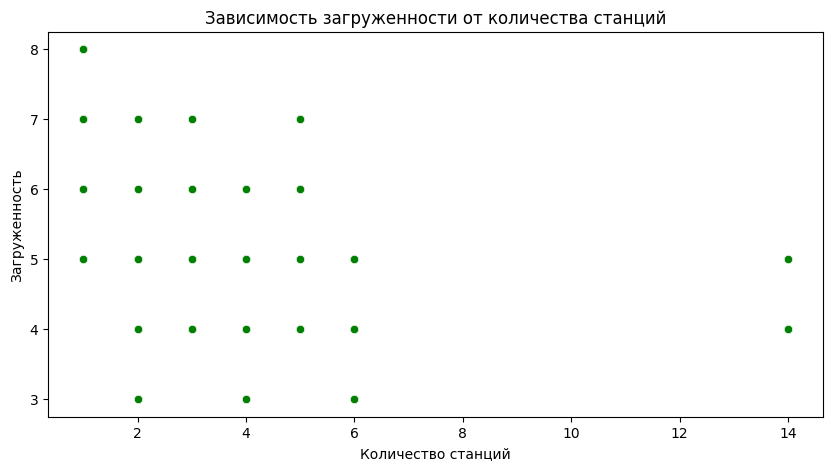

In [ ]:
plt.figure(figsize=(10, 5))
sns.scatterplot(x='number_of_stations', y='station_load', data=dta, c='green')
plt.title('Зависимость загруженности от количества станций')
plt.xlabel('Количество станций')
plt.ylabel('Загруженность')
plt.show()

Тут убеждаемся, что чем меньше количество станций, тем больше загруженность(зависит также от часа пик)

Также интересно было бы глянуть на среднюю загруженность станций по месяцам(какие месяцы имеют самую высокую загруженность)

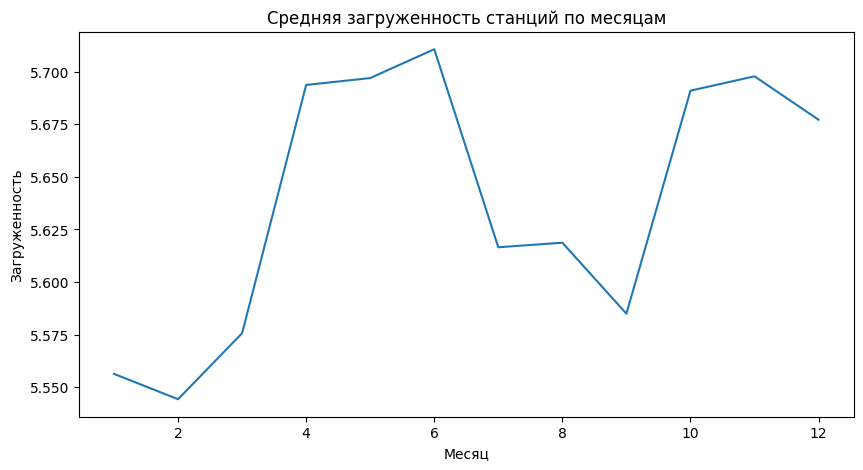

In [ ]:
dta['month'] = dta['timestamp'].dt.month
month_load = dta.groupby('month')['station_load'].mean()

plt.figure(figsize=(10, 5))
month_load.plot(kind='line', title='Средняя загруженность станций по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Загруженность')
plt.show()

Мы видим, что средняя загруженность летом и зимой достигает пика, что вполне оправданно учитывая пробки в данные сезоны и что спрос на метро повышается

Также имеет смысл задаться вопросом о том, как загруженность метро влияет на количество поездок

In [ ]:
grouped = dta.groupby('station_load')[['n_taxi_start', 'n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']].mean().reset_index()

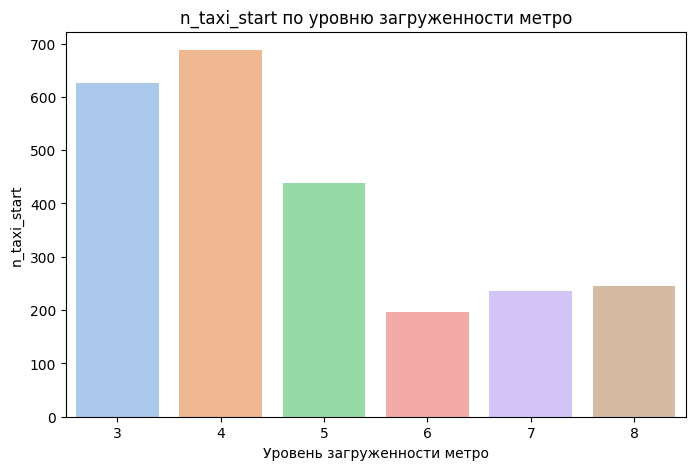

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(x='station_load', y='n_taxi_start', data=grouped, hue='station_load', palette='pastel', legend=False)
plt.title('n_taxi_start по уровню загруженности метро')
plt.xlabel('Уровень загруженности метро')
plt.ylabel('n_taxi_start')
plt.show()

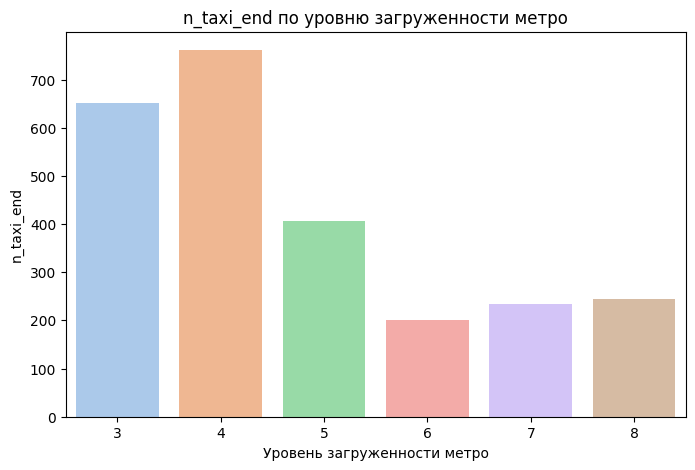

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(x='station_load', y='n_taxi_end', data=grouped, hue='station_load', palette='pastel', legend=False)
plt.title('n_taxi_end по уровню загруженности метро')
plt.xlabel('Уровень загруженности метро')
plt.ylabel('n_taxi_end')
plt.show()

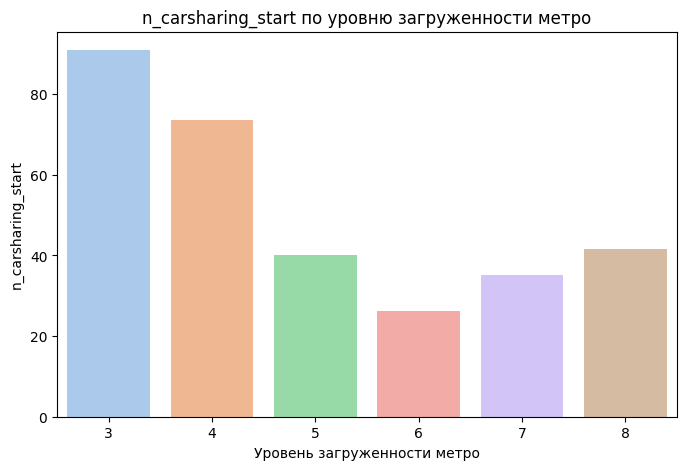

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(x='station_load', y='n_carsharing_start', hue='station_load', data=grouped, palette='pastel', legend=False)
plt.title('n_carsharing_start по уровню загруженности метро')
plt.xlabel('Уровень загруженности метро')
plt.ylabel('n_carsharing_start')
plt.show()

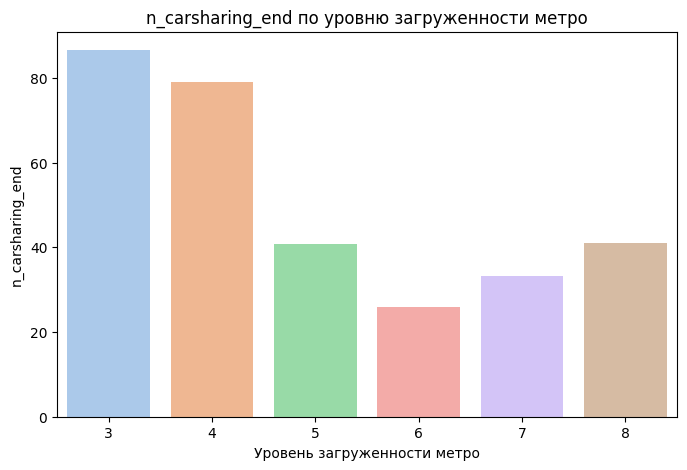

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(x='station_load', y='n_carsharing_end', hue='station_load', data=grouped, palette='pastel', legend=False)
plt.title('n_carsharing_end по уровню загруженности метро')
plt.xlabel('Уровень загруженности метро')
plt.ylabel('n_carsharing_end')
plt.show()

### Корреляция стоимости жилья и спроса на такси

#### Цены на недвижимость по районам Москвы - карта

Посмотрим, как распределены цены на недвижимость в зависимости от районов - для наглядности построим карту (хороплет).

In [ ]:

msc_estate_price_final = pd.read_csv('data/msc_estate_price_final.csv',sep=',')

In [ ]:
# Преобразуем в словарь для быстрого поиска цены по названию района
price_dict = dict(zip(msc_estate_price_final['district_name'], msc_estate_price_final['price_m2']))

# Добавляем стоимость жилья в свойства районов GeoJSON
for feature in msc_borders_clean['features']:
    district_name = feature['properties']['name']
    feature['properties']['price_m2'] = price_dict.get(district_name)

# Создаем карту Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Добавляем хороплет-карту с ценами на жилье
choropleth = Choropleth(
    geo_data=msc_borders_clean,
    data=price_dict,
    columns=['district_name', 'price_m2'],
    key_on='feature.properties.name',  # Связываем с name в GeoJSON
    fill_color='YlOrRd',  # Цветовая гамма (желтый -> оранжевый -> красный)
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Средняя стоимость жилья (тыс. руб. за м²)'
).add_to(m)

# Добавляем всплывающую информацию при наведении на район
folium.GeoJson(
    msc_borders_clean,
    style_function=lambda feature: {
        "fillColor": "transparent",  # Не перезаписываем цвет
        "color": "black",
        "weight": 1,
        "fillOpacity": 0
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "price_m2"],
        aliases=["Район", "Цена за м² (тыс. руб.)"],
        localize=True,
        sticky=False
    )
).add_to(m)

from branca.element import Element
# CSS для скрытия надписи Leaflet
css = """
<style>
.leaflet-control-attribution {
    display: none !important;
}
</style>
"""
# Добавляем стиль на карту
m.get_root().html.add_child(Element(css))

# Отображаем карту
m

Как мы видим - самые дорогие районы сосредоточены в центре Москвы. Дополнительно сделаем диаграмму с топ-10 райнов по ценам.

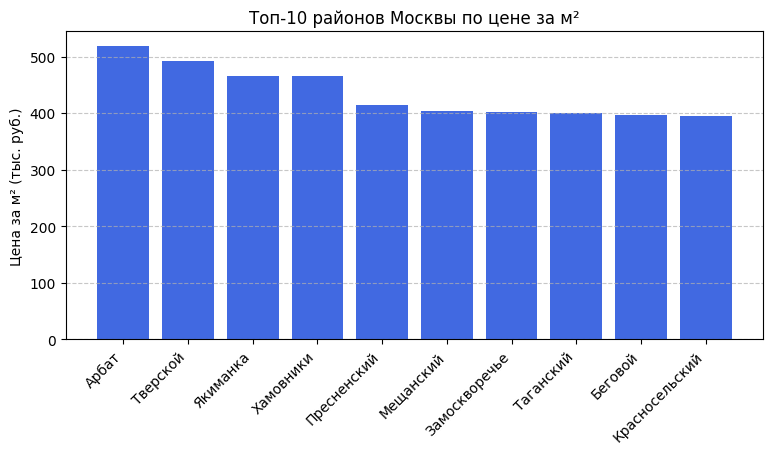

In [ ]:
# Сортируем и выбираем топ-10 районов
top_10 = msc_estate_price_final.nlargest(10, "price_m2")

# Убираем слово "район" в топ-10
top_10["district_name"] = top_10["district_name"].str.replace(r"\bрайон\b", "", regex=True).str.strip()

# Строим вертикальный график
plt.figure(figsize=(9, 4))
plt.bar(top_10["district_name"], top_10["price_m2"], color="royalblue")
plt.ylabel("Цена за м² (тыс. руб.)")
plt.xticks(rotation=45, ha="right")  # Поворачиваем подписи для читаемости
plt.title("Топ-10 районов Москвы по цене за м²")
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()

#### Корреляция цены недвижимости и числа поездок на такси

Для оценки корреляции цены недвижимости и числа поездок введём дополнительный признак — количество поездок на человека. Это позволит нормализовать данные, исключив влияние плотности населения: более крупные районы могут демонстрировать большее количество поездок не из-за высокого уровня жизни, а просто потому что там проживает больше людей.

Также, рассмотрим корреляцию в разные временные промежутки: рабочие дни и выходные, часы пик и внепиковые часы.Такое разделение поможет понять, как в каждом временном промежутке цена на недвижимость может оказывать влияние на выбор такси. Например, в районах с высокой стоимостью жилья может быть выше спрос на такси и в рабочие дни, и в выходные, поскольку люди с высокой покупательной способностью имеют более высокую потребность в комфортных поездках.

In [ ]:
# Сделаем агрегационные функции для n_taxi_start и end для разных временных промежутков
agg_funcs = {
    'total_per_person': lambda x, col: (x[col].sum() / x['population_district_2023'].iloc[0]),
    'offpeak_per_person': lambda x, col: (x[x['rush_hour'] == 0][col].sum() / x['population_district_2023'].iloc[0]),
    'rushhour_per_person': lambda x, col: (x[x['rush_hour'] == 1][col].sum() / x['population_district_2023'].iloc[0]),
    'weekend_per_person': lambda x, col: (x[x['is_holiday_or_weekend'] == 1][col].sum() / x['population_district_2023'].iloc[0]),
    'weekday_per_person': lambda x, col: (x[x['is_holiday_or_weekend'] == 0][col].sum() / x['population_district_2023'].iloc[0]),
    'price_m2': lambda x: x['price_m2'].iloc[0]
}

# Применяем агрегацию для start и end
def aggregate_data(df, col):
    return pd.Series({k: f(df, col) if k != 'price_m2' else f(df) for k, f in agg_funcs.items()})

# Применяем агрегацию для обеих колонок: start и end
summary_start = main_df.groupby('district_name').apply(lambda df: aggregate_data(df, 'n_taxi_start'))
summary_end = main_df.groupby('district_name').apply(lambda df: aggregate_data(df, 'n_taxi_end'))

# Соединяем данные
summary = pd.concat([summary_start, summary_end], axis=1, keys=['start', 'end'])

# Выводим таблицу
# Теперь каждому району соответствует количество поездок на человека в целом за год, в выходные,рабочие дни, пиковые и непиковые часы дня
print(summary.head(5))

# Корреляции с ценой для start и end поездок
correlations_start = summary['start'].drop(columns='price_m2').corrwith(summary['start']['price_m2']).to_frame().T
correlations_end = summary['end'].drop(columns='price_m2').corrwith(summary['end']['price_m2']).to_frame().T

# Переименовываем индексы для ясности
correlations_start.index = ['n_taxi_start']
correlations_end.index = ['n_taxi__end']

# Объединяем корреляции для start и end в одну таблицу
correlations_all = pd.concat([correlations_start, correlations_end])

# Выводим результат корреляции
print("\n📈 Общие корреляции:\n", correlations_all)



<ipython-input-22-8302f33bdd93>:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary_start = main_df.groupby('district_name').apply(lambda df: aggregate_data(df, 'n_taxi_start'))


                               start                                                                                                    end                                                                                      
                    total_per_person offpeak_per_person rushhour_per_person weekend_per_person weekday_per_person price_m2 total_per_person offpeak_per_person rushhour_per_person weekend_per_person weekday_per_person price_m2
district_name                                                                                                                                                                                                                    
Академический район        19.755374          13.104299            3.260867           5.353667          14.401707    317.4        18.543768          12.889652            2.693015           5.176620          13.367149    317.4
Алексеевский район         38.706062          26.084469            6.277566          11.315780  

<ipython-input-22-8302f33bdd93>:17: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary_end = main_df.groupby('district_name').apply(lambda df: aggregate_data(df, 'n_taxi_end'))


Для start (0.484) и end (0.444) поездок наблюдается умеренная положительная корреляция с ценой на недвижимость, то есть в более дорогих районах люди чаще используют услуги такси.

Корреляция для начала поездок усиливается во внепиковые часы  (0.502), и значительно ослабевает в пиковые (0.295), связанные с началом и окончанием рабочего дня. Скорее всего это связано с тем, что в более дорогих, центральных районах люди предпочитают использовать альтернативные виды транспорта в часы пик, но в то же время, могут позволить себе больше поездок, не связанных с работой (например, в выходные (0.491) или для личных нужд).

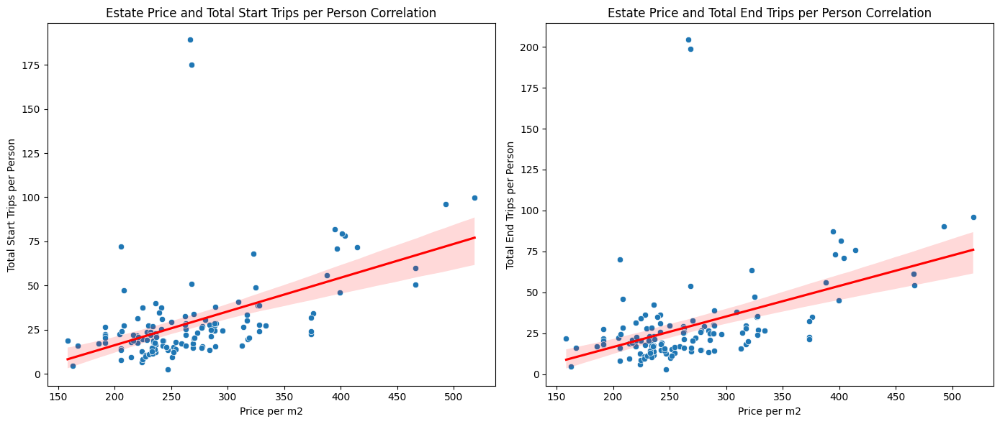

In [ ]:
# Для наглядности построим графики корреляции для n_taxi_start и end в целом за год

# Размер графиков
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# График для n_taxi_start
sns.scatterplot(data=summary['start'], x='price_m2', y='total_per_person', ax=axes[0])
sns.regplot(data=summary['start'], x='price_m2', y='total_per_person', scatter=False, color='r', ax=axes[0])

# Добавляем заголовок и подписи для первого графика
axes[0].set_title('Estate Price and Total Start Trips per Person Correlation')
axes[0].set_xlabel('Price per m2')
axes[0].set_ylabel('Total Start Trips per Person')

# График для n_taxi_end
sns.scatterplot(data=summary['end'], x='price_m2', y='total_per_person', ax=axes[1])
sns.regplot(data=summary['end'], x='price_m2', y='total_per_person', scatter=False, color='r', ax=axes[1])

# Добавляем заголовок и подписи для второго графика
axes[1].set_title('Estate Price and Total End Trips per Person Correlation')
axes[1].set_xlabel('Price per m2')
axes[1].set_ylabel('Total End Trips per Person')

# Показываем графики
plt.tight_layout()
plt.show()


График для начала поездок (n_taxi_start):
- Наклон линии тренда положительный: чем выше цена за квадратный метр, тем больше поездок на человека в целом. Это свидетельствует о том, что в более дорогих районах люди, вероятно, чаще используют такси, возможно, из-за более высокого дохода и более гибких рабочих графиков. Однако рассеяние точек довольно широкое, особенно для районов с низкими ценами, что указывает на отсутствие строгой зависимости и возможное влияние других факторов, таких как плотность населения или доступность альтернативных транспортных средств.

График для окончания поездок (n_taxi_end):
- Наклон линии тренда также положительный, но менее выраженный, чем для начала поездок. В более дорогих районах люди, вероятно, чаще используют такси и для возвращения домой, хотя зависимость менее выражена. Рассеяние точек для конечных поездок тоже довольно широкое, что подтверждает более слабую корреляцию по сравнению с начальными поездками.

В целом, оба графика подтверждают, что в более дорогих районах наблюдается тенденция к большему количеству поездок на такси, но эта зависимость имеет умеренный характер и зависит от многих факторов.

#### Корреляция цены недвижимости и числа поездок на каршеринге

Каршеринг чаще используют для личных поездок, путешествий, отдыха, а также для коротких поездок по городу. Люди могут выбирать каршеринг для нерабочих поездок в выходные дни или летом, когда они чаще путешествуют, поэтому помимо общей корреляции, дополнительно посчитаем коэффициенты по сезонам и признаку выходной/ не выходной.

In [ ]:
# Агрегационные функции для каршеринга, с учетом сезона и выходных
agg_funcs_carsharing = {
    'total_per_person': lambda x, col: (x[col].sum() / x['population_district_2023'].iloc[0]),
    'winter': lambda x, col: (x[x['season'] == 0][col].sum() / x['population_district_2023'].iloc[0]),
    'spring': lambda x, col: (x[x['season'] == 1][col].sum() / x['population_district_2023'].iloc[0]),
    'summer': lambda x, col: (x[x['season'] == 2][col].sum() / x['population_district_2023'].iloc[0]),
    'autumn': lambda x, col: (x[x['season'] == 3][col].sum() / x['population_district_2023'].iloc[0]),
    'isweekend': lambda x, col: (x[x['is_holiday_or_weekend'] == 1][col].sum() / x['population_district_2023'].iloc[0]),
    'notweekend': lambda x, col: (x[x['is_holiday_or_weekend'] == 0][col].sum() / x['population_district_2023'].iloc[0]),
    'price_m2': lambda x: x['price_m2'].iloc[0]
}

# Функция для start и end
def aggregate_carsharing_data(df, col):
    return pd.Series({k: f(df, col) if k != 'price_m2' else f(df) for k, f in agg_funcs_carsharing.items()})

# Применяем агрегацию для start и end
summary_carsharing_start = main_df.groupby('district_name').apply(lambda df: aggregate_carsharing_data(df, 'n_carsharing_start'))
summary_carsharing_end = main_df.groupby('district_name').apply(lambda df: aggregate_carsharing_data(df, 'n_carsharing_end'))

# Соединяем данные
summary_carsharing = pd.concat([summary_carsharing_start, summary_carsharing_end], axis=1, keys=['start', 'end'])

# Выводим таблицу
print(summary_carsharing.head(5))

# Корреляции с ценой для каршеринг start и end
correlations_carsharing_start = summary_carsharing['start'].drop(columns='price_m2').corrwith(summary_carsharing['start']['price_m2']).to_frame().T
correlations_carsharing_end = summary_carsharing['end'].drop(columns='price_m2').corrwith(summary_carsharing['end']['price_m2']).to_frame().T

# Переименовываем индексы
correlations_carsharing_start.index = ['n_carsharing_start']
correlations_carsharing_end.index = ['n_carsharing_end']

# Объединяем корреляции carsharing start и end в одну таблицу
correlations_carsharing_all = pd.concat([correlations_carsharing_start, correlations_carsharing_end])

# Выводим результат корреляции
print("\n📈 Общие корреляции для carsharing:\n", correlations_carsharing_all)


<ipython-input-24-7b7cd18f5c96>:18: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary_carsharing_start = main_df.groupby('district_name').apply(lambda df: aggregate_carsharing_data(df, 'n_carsharing_start'))


                               start                                                                                    end                                                                      
                    total_per_person    winter    spring    summer    autumn isweekend notweekend price_m2 total_per_person    winter    spring    summer    autumn isweekend notweekend price_m2
district_name                                                                                                                                                                                    
Академический район         2.357101  0.538078  0.584683  0.603932  0.630408  0.730811   1.626290    317.4         2.243908  0.512960  0.556285  0.571945  0.602719  0.696612   1.547297    317.4
Алексеевский район          5.138084  1.129617  1.312031  1.372990  1.323446  1.760188   3.377896    326.9         4.669603  1.041246  1.186231  1.235399  1.206726  1.580925   3.088677    326.9
Алтуфьевский район          1.

<ipython-input-24-7b7cd18f5c96>:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary_carsharing_end = main_df.groupby('district_name').apply(lambda df: aggregate_carsharing_data(df, 'n_carsharing_end'))


Корреляция между ценой недвижимости и количеством поездок на каршеринге есть, но она умеренная: коэффициенты для старта и окончания поездок находятся в диапазоне от 0.31 до 0.43.
Связь несколько сильнее для завершения поездок, что может быть связано с размещением каршеринговых стоянок в более дорогих районах.
По сезонам корреляция усиливается в теплые времена года - летом и весной.
В будние дни связь выше, чем в выходные, что объясняется большей деловой активностью в дорогих районах в рабочие дни.
В целом, цена недвижимости влияет на использование каршеринга, но не является  единственным определяющим фактором.

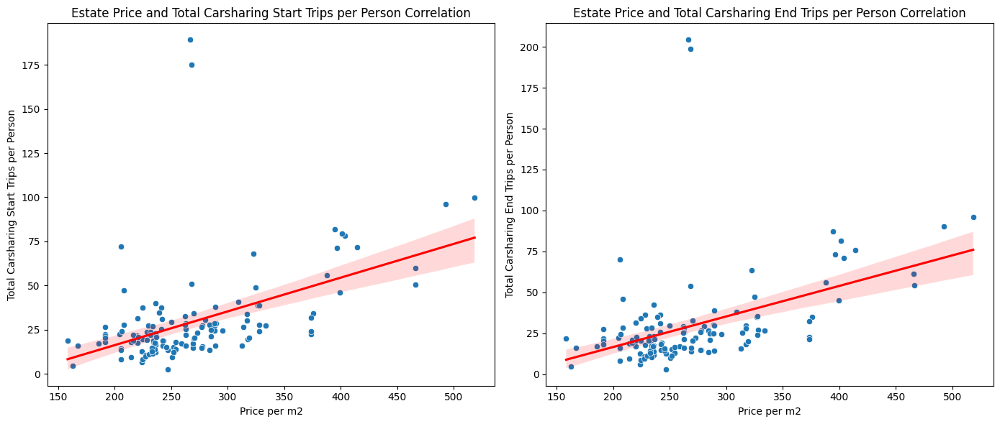

In [ ]:
# Функция для построения графиков корреляции для каршеринга
def plot_carsharing_correlation(summary):
    # Размер гарфиков
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # График для n_carsharing_start
    sns.scatterplot(data=summary['start'], x='price_m2', y='total_per_person', ax=axes[0])
    sns.regplot(data=summary['start'], x='price_m2', y='total_per_person', scatter=False, color='r', ax=axes[0])

    # Добавляем заголовок и подписи для первого графика
    axes[0].set_title('Estate Price and Total Carsharing Start Trips per Person Correlation')
    axes[0].set_xlabel('Price per m2')
    axes[0].set_ylabel('Total Carsharing Start Trips per Person')

    # График для n_carsharing_end
    sns.scatterplot(data=summary['end'], x='price_m2', y='total_per_person', ax=axes[1])
    sns.regplot(data=summary['end'], x='price_m2', y='total_per_person', scatter=False, color='r', ax=axes[1])

    # Добавляем заголовок и подписи для второго графика
    axes[1].set_title('Estate Price and Total Carsharing End Trips per Person Correlation')
    axes[1].set_xlabel('Price per m2')
    axes[1].set_ylabel('Total Carsharing End Trips per Person')

    # Показываем графики
    plt.tight_layout()
    plt.show()

# Применяем функцию для построения графиков
plot_carsharing_correlation(summary)


Линия тренда на обоих графиках имеет умеренный положительный наклон, что подтверждает наличие связи между ростом цены недвижимости и увеличением количества поездок на человека.
Точек на графиках довольно много и разброс значительный, особенно в районах с более низкими ценами — это указывает на наличие других факторов, влияющих на использование каршеринга. В целом связь слабее, чем в такси.

#### Количество поездок в зависимости от времени

Посмотрим,как количество поездок распределено во времени - в зависимости от сезона,месяца,дня недели и времени суток.Перед этим дополнительно добавим необходимые столбцы к основной таблице

In [ ]:
# Убедимся, что timestamp в правильном формате
main_df['timestamp'] = pd.to_datetime(main_df['timestamp'])

# Создаем дополнительные столбцы для анализа
main_df['day_of_week'] = main_df['timestamp'].dt.dayofweek  # День недели (0 - Понедельник, 6 - Воскресенье)
main_df['hour_of_day'] = main_df['timestamp'].dt.hour  # Часы суток
main_df['month'] = main_df['timestamp'].dt.month  # Месяц
main_df['season'] = main_df['month'].apply(lambda x: 'Зима' if x in [12, 1, 2] else
                                            ('Весна' if x in [3, 4, 5] else
                                             ('Лето' if x in [6, 7, 8] else 'Осень')))  # Сезон


In [ ]:
# Подсчитываем количество поездок по сезонам
rides_by_season = main_df.groupby('season')['n_taxi_start'].sum().reset_index()
print(rides_by_season)

# Подсчитываем количество поездок по месяцам
rides_by_month = main_df.groupby('month')['n_taxi_start'].sum().reset_index()
rides_by_month['season'] = main_df.groupby('month')['season'].first().values # к таблице с месяцами также добавим время года
print(rides_by_month.head())

# Подсчитываем количество поездок по дням недели
rides_by_day = main_df.groupby('day_of_week')['n_taxi_start'].sum().reset_index()
print(rides_by_day.head())

# Подсчитываем количество поездок по времени суток
rides_by_hour = main_df.groupby('hour_of_day')['n_taxi_start'].sum().reset_index()
print(rides_by_hour.head())

  season  n_taxi_start
0  Весна      81707874
1   Зима      74821750
2   Лето      78214671
3  Осень      76905044
   month  n_taxi_start season
0      1      24680714   Зима
1      2      22832199   Зима
2      3      28722230  Весна
3      4      26365254  Весна
4      5      26620390  Весна
   day_of_week  n_taxi_start
0            0      42245509
1            1      43045090
2            2      46426298
3            3      46350727
4            4      48565529
   hour_of_day  n_taxi_start
0            0       9495979
1            1       7213699
2            2       5045240
3            3       3678220
4            4       3223305


Данные подготовлены - теперь приступим к визуализации

<ipython-input-28-7be7bbae1bb7>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-28-7be7bbae1bb7>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-28-7be7bbae1bb7>:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс'])


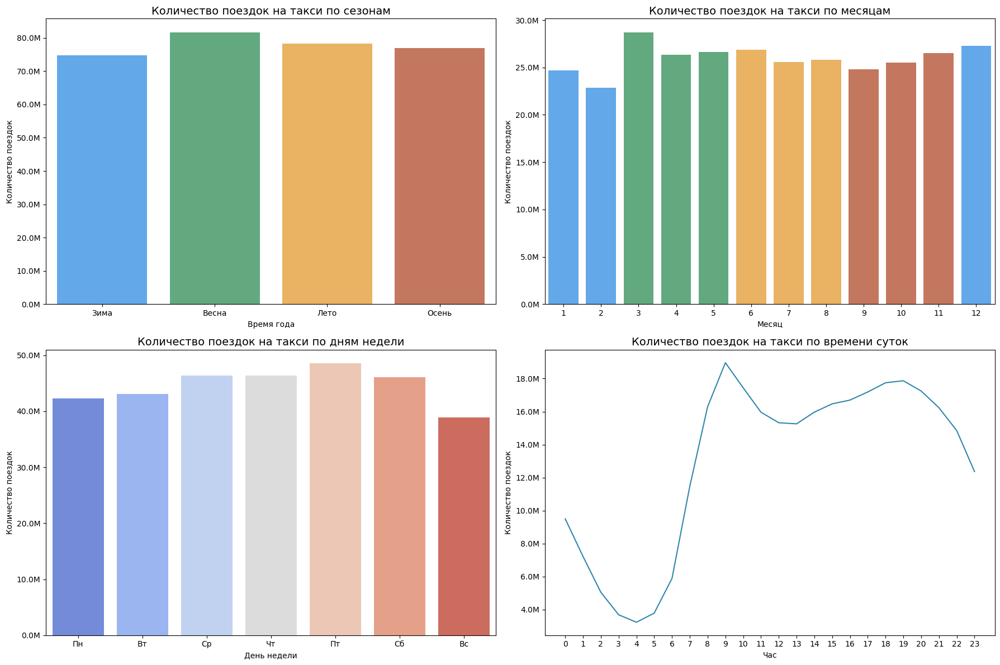

In [ ]:
# Создаем subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Функция для форматирования оси Y в миллионы
def millions(x, pos):
    return f'{x / 1e6:.1f}M'

# Цвета для сезонов
season_colors = {
    'Зима': '#4DA9FF',
    'Весна': '#56B57D',
    'Лето': '#FFB84D',
    'Осень': '#D56E4E'
}
season_order = ['Зима', 'Весна', 'Лето', 'Осень']

# График 1: Количество поездок по сезонам
sns.barplot(
    data=rides_by_season,
    x='season',
    y='n_taxi_start',
    order=season_order,
    palette=[season_colors[season] for season in season_order],
    ax=axes[0, 0]
)
axes[0, 0].set_title('Количество поездок на такси по сезонам', fontsize=14)
axes[0, 0].set_xlabel('Время года')
axes[0, 0].set_ylabel('Количество поездок')
axes[0, 0].yaxis.set_major_formatter(FuncFormatter(millions))

# График 2: Количество поездок по месяцам
sns.barplot(
    data=rides_by_month,
    x='month',
    y='n_taxi_start',
    hue='season',
    palette=season_colors,
    ax=axes[0, 1]
)
axes[0, 1].set_title('Количество поездок на такси по месяцам', fontsize=14)
axes[0, 1].set_xlabel('Месяц')
axes[0, 1].set_ylabel('Количество поездок')
axes[0, 1].yaxis.set_major_formatter(FuncFormatter(millions))
# Убираем легенду
axes[0, 1].legend_.remove()

# График 3: Количество поездок по дням недели
sns.barplot(
    data=rides_by_day,
    x='day_of_week',
    y='n_taxi_start',
    palette="coolwarm",
    ax=axes[1, 0]
)
axes[1, 0].set_title('Количество поездок на такси по дням недели', fontsize=14)
axes[1, 0].set_xlabel('День недели')
axes[1, 0].set_ylabel('Количество поездок')
axes[1, 0].set_xticklabels(['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс'])
axes[1, 0].yaxis.set_major_formatter(FuncFormatter(millions))

# График 4: Количество поездок по времени суток
sns.lineplot(
    data=rides_by_hour,
    x='hour_of_day',
    y='n_taxi_start',
    ax=axes[1, 1],
    color='#2E86AB'
)
axes[1, 1].set_title('Количество поездок на такси по времени суток', fontsize=14)
axes[1, 1].set_xlabel('Час')
axes[1, 1].set_ylabel('Количество поездок')
axes[1, 1].set_xticks(range(0, 24, 1))  # каждый час
axes[1, 1].set_xticklabels([str(i) for i in range(0, 24, 1)])  # только числа
axes[1, 1].yaxis.set_major_formatter(FuncFormatter(millions))

# Компоновка
plt.tight_layout()
plt.show()




Из полученных гарфиков мы видим, что больше всего поездок на такси наблюдается весной и в марте, меньше всего - зимой и в феврале. В зависимости от дня недели, чаще всего пользуются такси в пятницу, реже - в воскресенье. Также сильно прослеживается завимость от пиковых часов - больше всего поездок утром с 8 до 9 и вечером с 18 до 19.

Теперь сделаем аналогичные графики для поездок на каршеринге.

<ipython-input-29-416879223f23>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-29-416879223f23>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-29-416879223f23>:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс'])


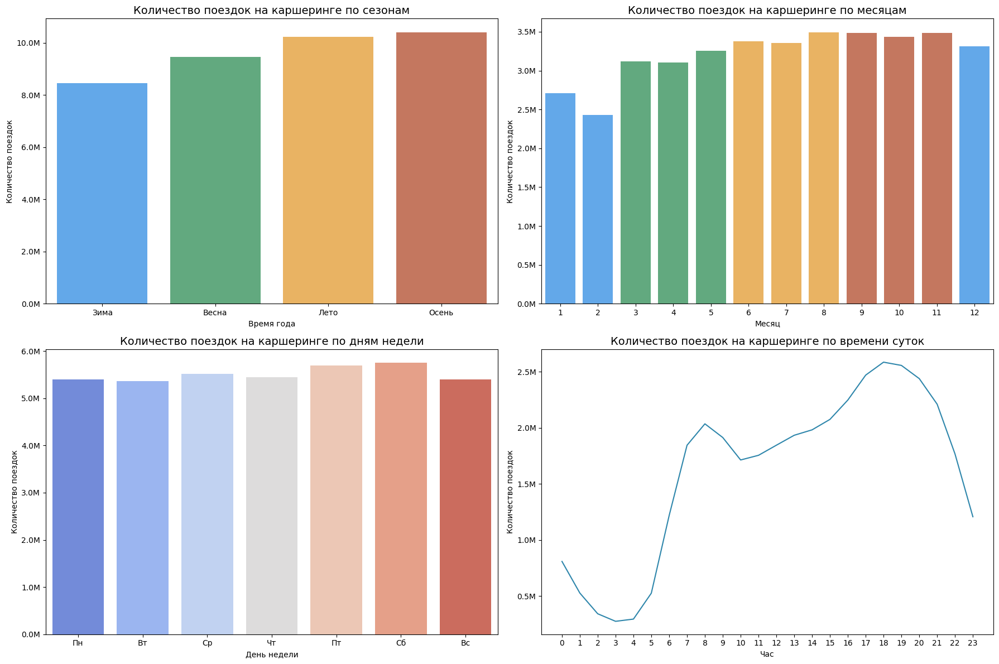

In [ ]:
# Считаем агрегации для каршеринга
rides_by_season_cs = main_df.groupby('season')['n_carsharing_start'].sum().reset_index()
rides_by_month_cs = main_df.groupby('month')['n_carsharing_start'].sum().reset_index()
rides_by_month_cs['season'] = main_df.groupby('month')['season'].first().values
rides_by_day_cs = main_df.groupby('day_of_week')['n_carsharing_start'].sum().reset_index()
rides_by_hour_cs = main_df.groupby('hour_of_day')['n_carsharing_start'].sum().reset_index()

# Создаем subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Функция для форматирования оси Y в миллионы
def millions(x, pos):
    return f'{x / 1e6:.1f}M'

# Цвета для сезонов
season_colors = {
    'Зима': '#4DA9FF',
    'Весна': '#56B57D',
    'Лето': '#FFB84D',
    'Осень': '#D56E4E'
}
season_order = ['Зима', 'Весна', 'Лето', 'Осень']

# График 1: Количество поездок по сезонам
sns.barplot(
    data=rides_by_season_cs,
    x='season',
    y='n_carsharing_start',
    order=season_order,
    palette=[season_colors[season] for season in season_order],
    ax=axes[0, 0]
)
axes[0, 0].set_title('Количество поездок на каршеринге по сезонам', fontsize=14)
axes[0, 0].set_xlabel('Время года')
axes[0, 0].set_ylabel('Количество поездок')
axes[0, 0].yaxis.set_major_formatter(FuncFormatter(millions))

# График 2: Количество поездок по месяцам
sns.barplot(
    data=rides_by_month_cs,
    x='month',
    y='n_carsharing_start',
    hue='season',
    palette=season_colors,
    ax=axes[0, 1]
)
axes[0, 1].set_title('Количество поездок на каршеринге по месяцам', fontsize=14)
axes[0, 1].set_xlabel('Месяц')
axes[0, 1].set_ylabel('Количество поездок')
axes[0, 1].yaxis.set_major_formatter(FuncFormatter(millions))
# Убираем легенду
axes[0, 1].legend_.remove()

# График 3: Количество поездок по дням недели
sns.barplot(
    data=rides_by_day_cs,
    x='day_of_week',
    y='n_carsharing_start',
    palette="coolwarm",
    ax=axes[1, 0]
)
axes[1, 0].set_title('Количество поездок на каршеринге по дням недели', fontsize=14)
axes[1, 0].set_xlabel('День недели')
axes[1, 0].set_ylabel('Количество поездок')
axes[1, 0].set_xticklabels(['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс'])
axes[1, 0].yaxis.set_major_formatter(FuncFormatter(millions))

# График 4: Количество поездок по времени суток
sns.lineplot(
    data=rides_by_hour_cs,
    x='hour_of_day',
    y='n_carsharing_start',
    ax=axes[1, 1],
    color='#2E86AB'
)
axes[1, 1].set_title('Количество поездок на каршеринге по времени суток', fontsize=14)
axes[1, 1].set_xlabel('Час')
axes[1, 1].set_ylabel('Количество поездок')
axes[1, 1].set_xticks(range(0, 24, 1))
axes[1, 1].set_xticklabels([str(i) for i in range(0, 24, 1)])
axes[1, 1].yaxis.set_major_formatter(FuncFormatter(millions))

# Компоновка
plt.tight_layout()
plt.show()



Чаще всего каршерингом пользуются осенью и летом, особенно в августе, сентябре и ноябре, реже всего - зимой, в феврале. Сезонность поездок прослеживается сильнее,чем в такси. Частота поездок в пятницу и субботу выше, самая низкая в воскресенье, но в целом распределение по дням недели относительно равномерное. Пик начала поездкок , в отличие от такси, приходится на вечер - с 17 до 19.

### 5. Выводы

### Итоговые выводы по проекту "Прогнозирование спроса на такси/каршеринг по районам Москвы"

### Основные результаты исследования

#### 1. Характеристика данных и предобработка
- Проанализирован датасет из **1 156 320 записей** с почасовой детализацией за 2024 год
- Выделено **25 ключевых признаков**, включая:
  - Транспортные метрики (поездки такси/каршеринг)
  - Временные факторы (час, день недели, сезон)
  - Погодные условия
  - Социально-экономические показатели районов
- Данные прошли полный цикл предобработки:
  - Проверка на пропуски и дубликаты
  - Корректное приведение типов данных
  - Добавление производных признаков (час пик, выходные и др.)

#### 2. Ключевые закономерности спроса

#### Временные паттерны:
- **Суточная динамика**:
  - Четкие пики в утренние (8:00-9:00) и вечерние (17:00-19:00) часы
  - Минимальная активность ночью (0:00-5:00)
- **Недельная динамика**:
  - Максимум спроса на такси в пятницу
  - Максимум спроса на каршеринг в субботу
- **Сезонность**:
  - Летние месяцы (июль-август) - период максимальной активности
  - Зимние месяцы (январь-февраль) - спад спроса

#### Географическое распределение:
- **Центральный округ**:
  - Абсолютный лидер по такси (60+ млн поездок)
  - Ограниченное использование каршеринга (проблемы с парковками)
- **Западный и Юго-Западный округа**:
  - Максимальная активность каршеринга
  - Сбалансированное использование с такси
- **ТиНАО**:
  - Доминирование такси в Троицком округе
  - Преимущество каршеринга в Новомосковском округе

#### 3. Корреляционный анализ
- **Высокая корреляция (0.7-0.8)** на почасовом уровне - общие поведенческие паттерны
- **Слабая/отрицательная корреляция** при агрегации по дням/неделям - разные долгосрочные тренды
- **Основные факторы влияния**:
  - Временные (час пик, выходные)
  - Погодные (осадки, температура)
  - Инфраструктурные (наличие станций метро)
  - Социально-экономические (стоимость жилья, плотность населения)

#### 4. Рекомендации для бизнеса
1. **Оптимизация парка транспортных средств**:
   - Увеличение количества машин каршеринга в Южных и Новомосковском округах
   - Концентрация такси в ЦАО в часы пик

2. **Инфраструктурные улучшения**:
   - Развитие парковочных зон для каршеринга в центре
   - Создание специальных зон для такси у транспортных узлов

3. **Маркетинговые стратегии**:
   - Дифференцированные тарифы в зависимости от времени суток
   - Специальные предложения для окраинных районов

4. **Направления дальнейших исследований**:
   - Анализ влияния точечных событий (концерты, фестивали)
   - Изучение поведения разных демографических групп
   - Оптимизация зон покрытия сервисов

### Заключение
Проведенное исследование выявило сложную пространственно-временную структуру спроса на услуги такси и каршеринга в Москве. Полученные результаты позволяют:
- С высокой точностью прогнозировать нагрузку на транспортные сервисы
- Оптимизировать распределение ресурсов компании
- Разрабатывать персонализированные предложения для разных районов
- Планировать развитие инфраструктуры

Дальнейшее развитие проекта предполагает проверку гипотез и построение прогнозных моделей с учетом всех выявленных закономерностей.